In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

import warnings
warnings.filterwarnings('ignore') 

#setting max rows visibility
pd.options.display.max_rows = 40000

#setting max columns visibility to none
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from sklearn.linear_model import RidgeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import RFE
import statsmodels.api as sm
# for model evaluation
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

from sklearn.model_selection import cross_val_score, KFold
from sklearn.pipeline import make_pipeline

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, roc_auc_score, roc_curve

from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier


from imblearn.over_sampling import SMOTE

# Data Understanding

In [2]:
train_data = pd.read_csv('train.csv')
test_data=pd.read_csv("test.csv")

In [3]:
train_data.shape

(69999, 172)

In [4]:
train_data.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,NaN,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,Na

In [5]:
print(train_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Columns: 172 entries, id to churn_probability
dtypes: float64(135), int64(28), object(9)
memory usage: 91.9+ MB
None


In [6]:
train_data.dtypes.value_counts()

float64    135
int64       28
object       9
dtype: int64

## Null Value Detection

In [7]:
# checking the duplicates rows in the dataset
print('Number of duplicate rows in dataset:', train_data.duplicated().sum())

# Observation: All the records are unique

Number of duplicate rows in dataset: 0


In [8]:
train_data.describe()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.0,69297.0,69297.0,69297.0,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,17568.000000,17865.000000,18417.000000,69999.000000,69999.000000

In [9]:
# Cheking percent of missing values in columns
columns_with_values_df = (round(((train_data.isnull().sum()/len(train_data.index))*100),2).to_frame('null')).sort_values('null', ascending=False)
columns_with_values_df


,null
arpu_3g_6,74.90
count_rech_2g_6,74.90
night_pck_user_6,74.90
arpu_2g_6,74.90
date_of_last_rech_data_6,74.90
total_rech_data_6,74.90
av_rech_amt_data_6,74.90
max_rech_data_6,74.90
count_rech_3g_6,74.90
fb_user_6,74.90


In [10]:
# List the columns having more than 30% missing values
columns_with_above_30_per_null_values = list(columns_with_values_df.index[columns_with_values_df['null'] > 30])

In [11]:
print('Number of Columns which have more than 30% of records null:', len(columns_with_above_30_per_null_values))

Number of Columns which have more than 30% of records null: 30


In [12]:
print(columns_with_above_30_per_null_values)

['arpu_3g_6', 'count_rech_2g_6', 'night_pck_user_6', 'arpu_2g_6', 'date_of_last_rech_data_6', 'total_rech_data_6', 'av_rech_amt_data_6', 'max_rech_data_6', 'count_rech_3g_6', 'fb_user_6', 'night_pck_user_7', 'date_of_last_rech_data_7', 'total_rech_data_7', 'max_rech_data_7', 'fb_user_7', 'count_rech_2g_7', 'count_rech_3g_7', 'arpu_3g_7', 'av_rech_amt_data_7', 'arpu_2g_7', 'count_rech_2g_8', 'av_rech_amt_data_8', 'night_pck_user_8', 'max_rech_data_8', 'total_rech_data_8', 'arpu_2g_8', 'arpu_3g_8', 'date_of_last_rech_data_8', 'fb_user_8', 'count_rech_3g_8']


In [13]:
# Dropping the columns having more than 30% null records
train_data.drop(columns_with_above_30_per_null_values, axis=1, inplace=True)

In [14]:
# Checking the data after removing certain null columns
train_data.shape

total_columns_with_some_missing_values = train_data.isnull().any().sum()
print(f'There are {total_columns_with_some_missing_values} features which have null value with percentage below 30')

# Observation: Now we only left with 95 columns which have less than 30% of null value records


There are 95 features which have null value with percentage below 30


Filtering categorical and numerical columns separately from columns having null values

In [15]:
columns_with_missing_values = train_data.columns[train_data.isnull().any()]

# Convert it to a list
columns_with_missing_values_list = columns_with_missing_values.tolist()

In [16]:
# Filtering categorical and numerical variables
categorical_columns = train_data[columns_with_missing_values_list].columns[train_data[columns_with_missing_values_list].dtypes == 'object']
numerical_columns = train_data[columns_with_missing_values_list].columns[train_data[columns_with_missing_values_list].dtypes != 'object']
print('Number of categorical columns with some missing values:', len(categorical_columns)) 
print('Number of numerical columns with some missing values:', len(numerical_columns))

Number of categorical columns with some missing values: 5
Number of numerical columns with some missing values: 90


In [17]:
# Describing the numerical type columns
train_data[numerical_columns].describe()

# Observation: We can see from the result that there are columns that have mean=0 and std=0, which indicates that these columns shows no variation and have constant values for all records.
# Moving forward we will remove these types of columns

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8
count,69297.0,69297.0,69297.0,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000
mean,0.0,0.0,0.0,133.153275,133.894438,132.978257,198.874771,197.153383,196.543577,9.765435,7.014568,7.004892,14.186457,9.842191,9.771783,46.904854,46.166503,45.686109,93.238231,90.799240,91.121447,3.743179,3.777031,3.661652,1.126025,1.361052,1.420840,143.893585,140.750120,140.476486,80.619382,83.775851,83.471486,88.152110,91.538615,90.586999,1.126377,1.084062,1.057739,0.0,0.0,0.0,169.900601,176.401217,175.118852,0.845763,0.811100,0.841648,3.958619,4.976783,5.045027,0.462581,0.024425,0.033059,48.043255,47.882736,47.256388,107.152439,106.489856,108.154731,12.050672,12.563665,11.716763,167.255126,166.945103,167.136761,9.476958,9.873468,9.910217,20.734858,21.685359,21.089042,2.146273,2.199395,2.075179,0.0,0.0,0.0,32.360632,33.760809,33.077030,0.061932,0.033371,0.040392,7.394167,8.171162,8.348424,0.854063,1.019680,0.963214
std,0.0,0.0,0.0,299.963093,311.277193,311.896596,316.818355,322.482226,324.089234,57.374429,55.960985,53.408135,73.469261,58.511894,64.618388,150.971758,154.739002,153.716880,162.046699,153.852597,152.997805,13.319542,13.568110,13.009193,5.741811,7.914113,6.542202,252.034597,246.313148,245.342359,255.098355,266.693254,267.021929,255.771554,267.532089,270.032002,8.136645,8.325206,7.696853,0.0,0.0,0.0,392.046600,409.299501,410.697098,29.747486,29.220073,29.563367,15.854529,22.229842,17.708507,4.768437,1.716430,2.232547,140.499757,147.761124,141.249368,168.455999,165.452459,166.223461,39.416076,43.495179,38.606895,252.576231,254.688718,249.288410,51.664472,56.137824,54.248186,80

In [18]:
# Describing the categorical type columns
train_data[categorical_columns].describe()




,last_date_of_month_7,last_date_of_month_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8
count,69600,69266,68898,68765,67538
unique,1,1,30,31,31
top,7/31/2014,8/31/2014,6/30/2014,7/31/2014,8/31/2014
freq,69600,69266,11880,12206,10324


Observation:
1. There are two date columns last_date_of_month_7 and last_date_of_month_8 which contains null values. We can impute the last date of the month as null value.
2. There are three columns ['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8'] availeble which contains date of last recharge for every month. Imputing dates can make our model bias so we will derive some new columns from this and delete these columns.


##### Filtering columns with no variation

In [19]:
no_variation_columns = [i for i in numerical_columns if train_data[i].nunique() == 1]
no_variation_columns

['loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'std_og_t2c_mou_6',
 'std_og_t2c_mou_7',
 'std_og_t2c_mou_8',
 'std_ic_t2o_mou_6',
 'std_ic_t2o_mou_7',
 'std_ic_t2o_mou_8']

##### dropping columns with no variation

In [20]:
train_data.drop(no_variation_columns, axis=1, inplace=True)

Dropping 'id' and 'circle_id' as they we will be of no use for our solution

In [21]:
train_data.drop(['id', 'circle_id'], axis=1, inplace=True)

### Null Value Imputation

##### For Numerical Features:

In [22]:
numerical_columns = list(set(numerical_columns).difference(set(no_variation_columns)))
len(numerical_columns)

81

In [23]:
train_data[numerical_columns].describe(percentiles=[0.05, 0.10, 0.25, 0.50, 0.75, 0.85, 0.90, 0.95, 0.97, 0.99])

,offnet_mou_7,std_ic_t2f_mou_8,loc_og_t2f_mou_7,roam_ic_mou_8,std_ic_t2t_mou_8,loc_ic_mou_7,isd_ic_mou_8,loc_ic_t2m_mou_7,std_ic_t2f_mou_7,offnet_mou_8,spl_og_mou_6,loc_og_t2m_mou_6,loc_og_t2m_mou_7,std_ic_t2f_mou_6,offnet_mou_6,loc_og_t2m_mou_8,loc_ic_t2m_mou_6,roam_ic_mou_6,std_og_t2m_mou_8,loc_og_t2c_mou_6,loc_og_t2t_mou_8,std_og_mou_6,isd_ic_mou_6,loc_og_mou_7,loc_og_mou_8,std_ic_t2m_mou_8,loc_og_t2t_mou_7,spl_ic_mou_7,loc_ic_mou_6,ic_others_8,std_og_t2m_mou_6,isd_og_mou_7,std_og_t2t_mou_7,loc_og_t2c_mou_8,std_ic_t2t_mou_7,roam_og_mou_8,loc_ic_mou_8,loc_ic_t2t_mou_7,std_og_t2f_mou_7,loc_ic_t2t_mou_8,og_others_6,loc_ic_t2f_mou_7,std_og_t2m_mou_7,onnet_mou_7,loc_og_t2f_mou_8,loc_ic_t2t_mou_6,loc_ic_t2m_mou_8,loc_og_t2c_mou_7,spl_ic_mou_6,std_og_t2t_mou_8,loc_og_t2t_mou_6,std_ic_t2m_mou_7,loc_og_mou_6,spl_ic_mou_8,onnet_mou_6,roam_og_mou_7,isd_og_mou_6,std_ic_mou_7,onnet_mou_8,isd_og_mou_8,ic_others_7,isd_ic_mou_7,loc_og_t2f_mou_6,og_others_8,std_og_t2t_mou_6,roam_og_mou_6,roam_ic_mou_7,ic_others_6,std_og_mou_8,std_ic_mou_6,loc_ic_t2f_mou_6,std_og_mou_7,std_ic_mou_8,std_ic_t2t_mou_6,spl_og_mou_8,og_others_7,spl_og_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_6,loc_ic_t2f_mou_8,std_ic_t2m_mou_6
count,67312.000000,66296.000000,67312.000000,66296.000000,66296.000000,67312.000000,66296.000000,67312.000000,67312.000000,66296.000000,67231.000000,67231.000000,67312.000000,67231.000000,67231.000000,66296.000000,67231.000000,67231.000000,66296.000000,67231.000000,66296.000000,67231.000000,67231.000000,67312.000000,66296.000000,66296.000000,67312.000000,67312.000000,67231.000000,66296.000000,67231.000000,67312.000000,67312.000000,66296.000000,67312.000000,66296.000000,66296.000000,67312.000000,67312.000000,66296.000000,67231.000000,67312.000000,67312.000000,67312.000000,66296.000000,67231.000000,66296.000000,67312.000000,67231.000000,66296.000000,67231.000000,67312.000000,67231.000000,66296.000000,67231.000000,67312.000000,67231.000000,67312.000000,66296.000000,66296.000000,67312.000000,67312.000000,67231.000000,66296.000000,67231.000000,67231.000000,67312.000000,67231.000000,66296.000000,67231.000000,67231.000000,67312.000000,66296.000000,67231.000000,66296.000000,67312.000000,67312.000000,66296.000000,67231.000000,66296.000000,67231.000000
mean,197.153383,2.075179,3.777031,7.004892,9.910217,166.945103,8.348424,106.489856,2.199395,196.543577,3.958619,93.238231,90.799240,2.146273,198.874771,91.121447,107.152439,9.765435,90.586999,1.126025,45.686109,169.900601,7.394167,140.750120,140.476486,21.089042,46.166503,0.033371,167.255126,0.963214,88.152110,0.811100,83.775851,1.420840,9.873468,9.771783,167.136761,47.882736,1.084062,47.256388,0.462581,12.563665,91.538615,133.894438,3.661652,48.043255,108.154731,1.361052,0.061932,83.471486,46.904854,21.685359,143.893585,0.040392,133.153275,9.842191,0.845763,33.760809,132.978257,0.841648,1.019680,8.171162,3.743179,0.033059,80.619382,14.186457,7.014568,0.854063,175.118852,32.360632,12.050672,176.401217,33.077030,9.476958,5.045027,0.024425,4.976783,1.057739,1.126377,11.716763,20.734858
std,322.482226,15.865403,13.568110,53.408135,54.248186,254.688718,63.097570,165.452459,16.171533,324.089234,15.854529,162.046699,153.852597,16.522232,316.818355,152.997805,168.455999,57.374429,270.032002,5.741811,153.716880,392.046600,60.951165,246.313148,245.342359,81.534344,154.739002,0.137322,252.576231,11.697686,255.771554,29.220073,266.693254,6.542202,56.137824,64.618388,249.288410,147.761124,8.325206,141.249368,4.768437,43.495179,267.532089,311.277193,13.009193,140.499757,166.223461,7.914113,0.164823,267.021929,150.971758,87.314510,252.034597,0.148417,299.963093,58.511894,29.747486,114.142230,311.896596,29.563367,13.225373,63.604165,13.319542,2.232547,255.098355,73.469261,55.960985,12.149144,410.697098,104.381082,39.416076,409.299501,108.469864,51.664472,17.708507,1.716430,22.229842,7.696853,8.136645,38.606895,80.294236
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000

In [24]:
# Here We are imputing the mean value of the columns to treat null values.
for feature in numerical_columns:
    col_mean = train_data[feature].mean()
    train_data[feature].fillna(col_mean, inplace=True)

In [25]:
train_data[numerical_columns].isnull().any().sum()

# Observation: All the null values are imputed for numerical columns

0

##### For Categorical Features:

In [26]:
# Here we imputing '8/31/2014' as value to remove null values.
train_data['last_date_of_month_7'].fillna('7/31/2014', inplace=True)

In [27]:
# Here we imputing '9/31/2014' as value to remove null values.
train_data['last_date_of_month_8'].fillna('8/31/2014', inplace=True)

In [28]:
train_data['date_of_last_rech_6'] = pd.to_datetime(train_data['date_of_last_rech_6'])
train_data['date_of_last_rech_7'] = pd.to_datetime(train_data['date_of_last_rech_7'])
train_data['date_of_last_rech_8'] = pd.to_datetime(train_data['date_of_last_rech_8'])


Deriving new columns -> time_since_recharge_6 and time_since_recharge_7

In [29]:
train_data['time_since_recharge_6'] = (train_data['date_of_last_rech_8'] - train_data['date_of_last_rech_6']).dt.days
train_data['time_since_recharge_7'] = (train_data['date_of_last_rech_8'] - train_data['date_of_last_rech_7']).dt.days

train_data['time_since_recharge_6'].fillna(0, inplace = True)
train_data['time_since_recharge_7'].fillna(0, inplace = True)

In [30]:
# Now we can drop the last_rech columns.
drop_columns = ['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8']
train_data.drop(drop_columns, axis = 1, inplace=True)

In [31]:
train_data.isnull().any().sum()

# Observation: Now there are no null values in the dataset

0

In [32]:
# Dropping last date of month columns as they will not contribute in the final model
train_data.drop(columns=['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8'], axis=1, inplace=True)

In [33]:
train_data.shape

(69999, 127)

## Outlier Detection and Treatment

In [34]:
def create_outlier_percentage_df(df):
    outlier_percentage = {}
    for feature in df.columns:
        inter_quartile_range = df[feature].quantile(.75) - df[feature].quantile(.25)
        upper_range = df[feature].quantile(.75) + (1.5*inter_quartile_range)
        lower_range = df[feature].quantile(.25) - (1.5*inter_quartile_range)
        outlier_count = df[(df[feature] > upper_range) | (df[feature] < lower_range)].shape[0]
        outlier_percentage[feature] = round(outlier_count/df.shape[0]*100, 2)
    outlier_percentage_df = pd.DataFrame(list(outlier_percentage.items()), columns=['Features', 'Percentage'])
    return outlier_percentage_df

In [35]:
# Re-creating categorical and numerical columns list and a new datetime columns list
categorical_columns = train_data.columns[train_data.dtypes == 'object']
datetime_columns = train_data.columns[train_data.dtypes == 'datetime64[ns]']
numerical_columns = list(train_data.columns[(train_data.dtypes != 'object') | (train_data.dtypes != 'datetime64[ns]')])
numerical_columns.remove('churn_probability')

In [36]:
outlier_df = create_outlier_percentage_df(train_data[numerical_columns]).sort_values(by='Percentage', ascending=False)
outlier_df

,Features,Percentage
81,spl_ic_mou_6,24.84
72,std_ic_t2f_mou_6,24.46
73,std_ic_t2f_mou_7,24.41
25,loc_og_t2c_mou_7,24.16
26,loc_og_t2c_mou_8,23.53
12,roam_og_mou_6,23.46
9,roam_ic_mou_6,23.35
88,ic_others_7,23.21
24,loc_og_t2c_mou_6,22.94
74,std_ic_t2f_mou_8,22.79


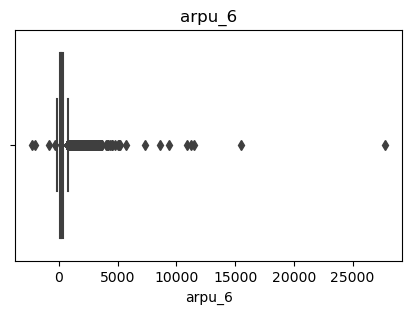

Data description: 
count    69999.000000
mean       283.134365
std        334.213918
min      -2258.709000
25%         93.581000
50%        197.484000
75%        370.791000
80%        430.414600
90%        619.993800
95%        832.022700
97%        998.301140
99%       1400.276640
max      27731.088000
Name: arpu_6, dtype: float64


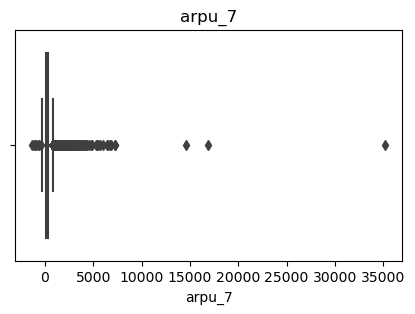

Data description: 
count    69999.000000
mean       278.185912
std        344.366927
min      -1289.715000
25%         86.714000
50%        191.588000
75%        365.369500
80%        423.113400
90%        615.661400
95%        823.236700
97%        991.631380
99%       1414.891380
max      35145.834000
Name: arpu_7, dtype: float64


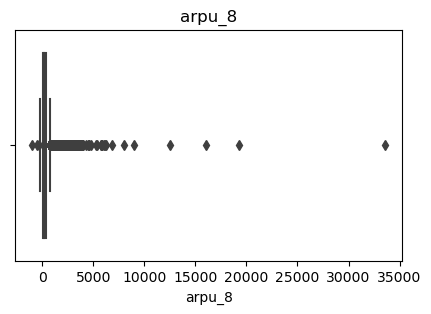

Data description: 
count    69999.000000
mean       278.858826
std        351.924315
min       -945.808000
25%         84.095000
50%        192.234000
75%        369.909000
80%        428.323200
90%        614.994600
95%        828.464700
97%       1001.924840
99%       1445.054800
max      33543.624000
Name: arpu_8, dtype: float64


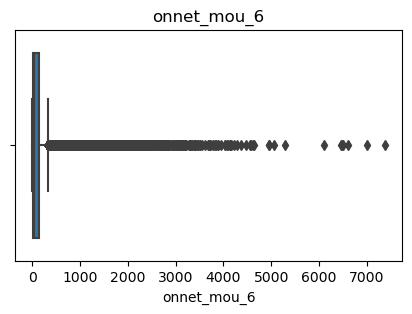

Data description: 
count    69999.000000
mean       133.153275
std        293.972404
min          0.000000
25%          8.060000
50%         37.730000
75%        133.153275
80%        152.718000
90%        331.766000
95%        598.600000
97%        832.244200
99%       1429.040400
max       7376.710000
Name: onnet_mou_6, dtype: float64


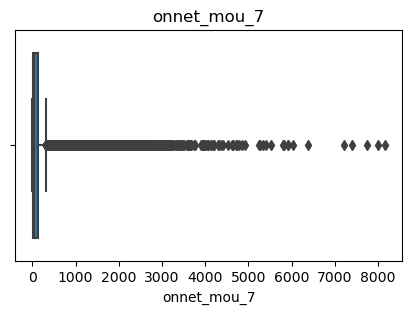

Data description: 
count    69999.000000
mean       133.894438
std        305.244261
min          0.000000
25%          7.260000
50%         35.690000
75%        133.894438
80%        149.900000
90%        334.886000
95%        608.878000
97%        857.698600
99%       1461.342200
max       8157.780000
Name: onnet_mou_7, dtype: float64


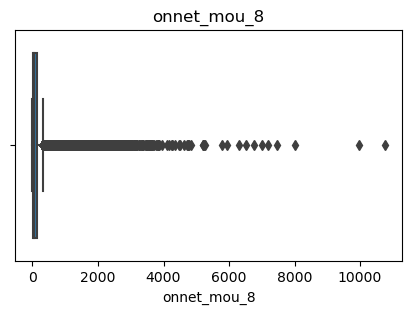

Data description: 
count    69999.000000
mean       132.978257
std        303.534603
min          0.000000
25%          7.360000
50%         36.790000
75%        132.978257
80%        145.698000
90%        326.298000
95%        596.125000
97%        834.183600
99%       1448.891000
max      10752.560000
Name: onnet_mou_8, dtype: float64


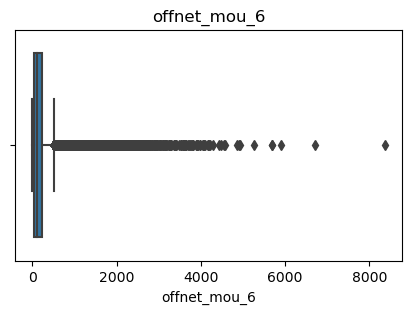

Data description: 
count    69999.000000
mean       198.874771
std        310.491042
min          0.000000
25%         36.880000
50%        103.830000
75%        223.540000
80%        274.990000
90%        468.898000
95%        719.500000
97%        938.364200
99%       1520.310000
max       8362.360000
Name: offnet_mou_6, dtype: float64


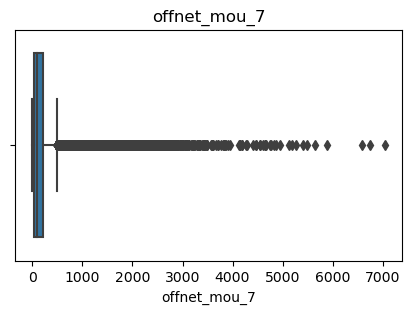

Data description: 
count    69999.000000
mean       197.153383
std        316.232126
min          0.000000
25%         33.980000
50%         98.580000
75%        218.350000
80%        270.918000
90%        470.054000
95%        731.602000
97%        943.480600
99%       1517.838600
max       7043.980000
Name: offnet_mou_7, dtype: float64


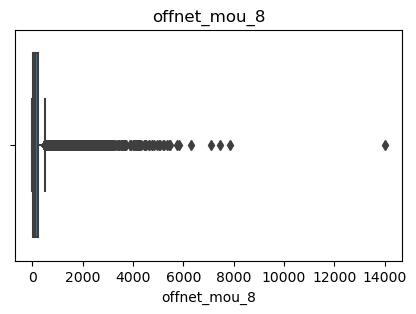

Data description: 
count    69999.000000
mean       196.543577
std        315.400354
min          0.000000
25%         34.390000
50%        101.680000
75%        216.410000
80%        269.748000
90%        467.636000
95%        715.915000
97%        927.201400
99%       1492.232400
max      14007.340000
Name: offnet_mou_8, dtype: float64


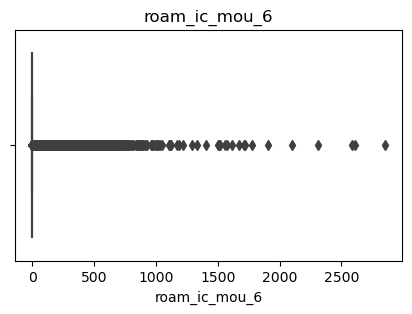

Data description: 
count    69999.000000
mean         9.765435
std         56.228580
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          1.880000
90%         10.890000
95%         38.842000
97%         75.891200
99%        213.827400
max       2850.980000
Name: roam_ic_mou_6, dtype: float64


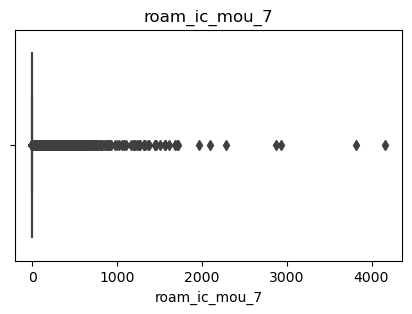

Data description: 
count    69999.000000
mean         7.014568
std         54.876393
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          7.014568
95%         21.562000
97%         46.580600
99%        149.030200
max       4155.830000
Name: roam_ic_mou_7, dtype: float64


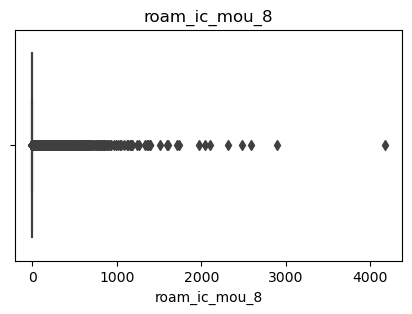

Data description: 
count    69999.000000
mean         7.004892
std         51.976255
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          7.004892
95%         21.992000
97%         46.730000
99%        150.231600
max       4169.810000
Name: roam_ic_mou_8, dtype: float64


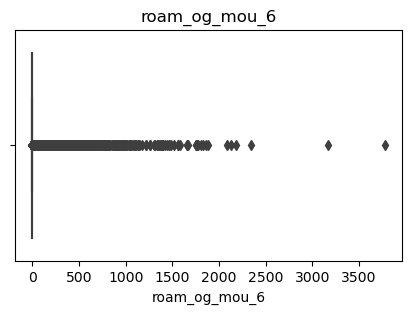

Data description: 
count    69999.000000
mean        14.186457
std         72.001975
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          3.330000
90%         20.864000
95%         65.931000
97%        120.416000
99%        284.721400
max       3775.110000
Name: roam_og_mou_6, dtype: float64


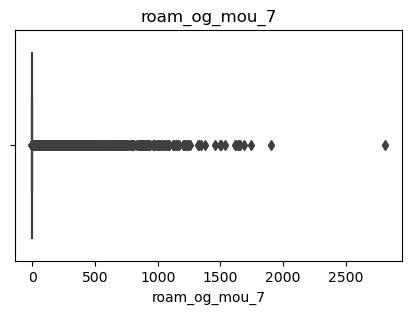

Data description: 
count    69999.000000
mean         9.842191
std         57.377862
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          9.842191
95%         40.185000
97%         79.061800
99%        216.591800
max       2812.040000
Name: roam_og_mou_7, dtype: float64


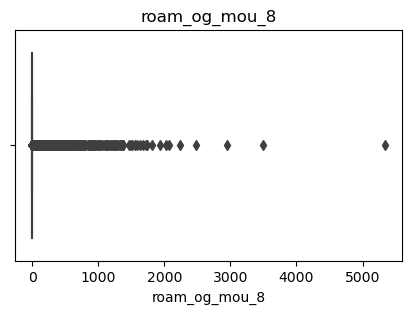

Data description: 
count    69999.000000
mean         9.771783
std         62.885960
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          9.771783
95%         38.842000
97%         76.898400
99%        206.347000
max       5337.040000
Name: roam_og_mou_8, dtype: float64


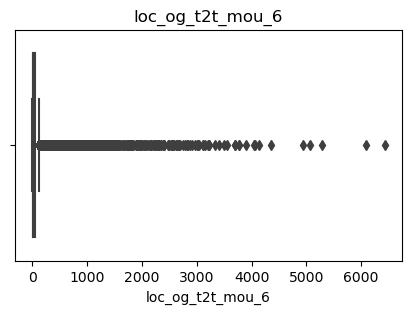

Data description: 
count    69999.000000
mean        46.904854
std        147.956637
min          0.000000
25%          1.930000
50%         13.230000
75%         46.904854
80%         50.748000
90%        101.114000
95%        172.230000
97%        249.083000
99%        535.069400
max       6431.330000
Name: loc_og_t2t_mou_6, dtype: float64


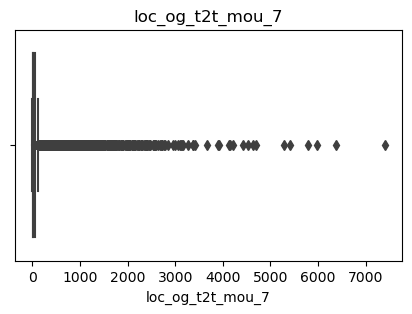

Data description: 
count    69999.000000
mean        46.166503
std        151.739971
min          0.000000
25%          1.880000
50%         12.840000
75%         46.166503
80%         49.668000
90%         98.110000
95%        169.392000
97%        241.845000
99%        518.193000
max       7400.660000
Name: loc_og_t2t_mou_7, dtype: float64


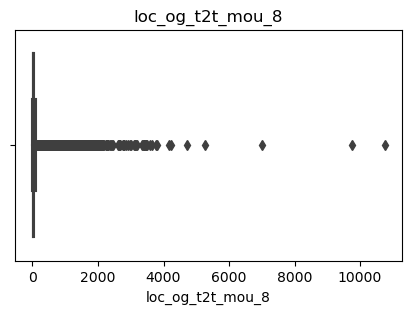

Data description: 
count    69999.000000
mean        45.686109
std        149.595708
min          0.000000
25%          1.950000
50%         13.540000
75%         45.686109
80%         49.090000
90%         97.230000
95%        167.636000
97%        239.041200
99%        506.684000
max      10752.560000
Name: loc_og_t2t_mou_8, dtype: float64


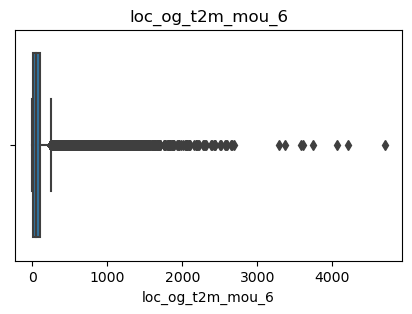

Data description: 
count    69999.000000
mean        93.238231
std        158.810396
min          0.000000
25%         10.830000
50%         44.640000
75%        105.685000
80%        132.248000
90%        227.686000
95%        348.722000
97%        450.333000
99%        733.829600
max       4696.830000
Name: loc_og_t2m_mou_6, dtype: float64


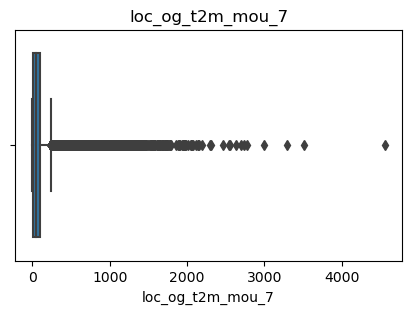

Data description: 
count    69999.000000
mean        90.799240
std        150.870746
min          0.000000
25%         10.935000
50%         43.490000
75%        103.330000
80%        129.340000
90%        221.760000
95%        340.352000
97%        446.089600
99%        714.383600
max       4557.140000
Name: loc_og_t2m_mou_7, dtype: float64


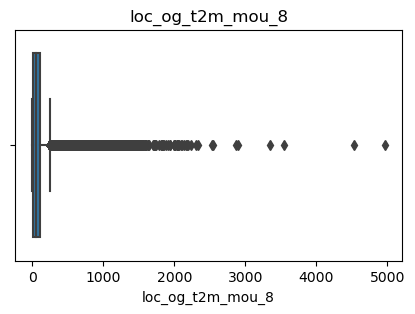

Data description: 
count    69999.000000
mean        91.121447
std        148.895911
min          0.000000
25%         11.140000
50%         45.130000
75%        103.110000
80%        129.250000
90%        223.132000
95%        337.531000
97%        440.567800
99%        716.447000
max       4961.330000
Name: loc_og_t2m_mou_8, dtype: float64


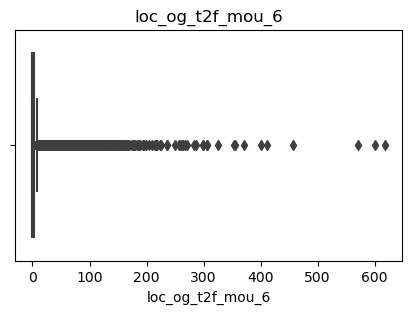

Data description: 
count    69999.000000
mean         3.743179
std         13.053532
min          0.000000
25%          0.000000
50%          0.000000
75%          2.830000
80%          3.743179
90%          9.130000
95%         18.160000
97%         26.890000
99%         53.390400
max        617.580000
Name: loc_og_t2f_mou_6, dtype: float64


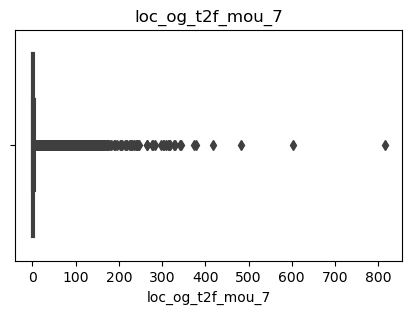

Data description: 
count    69999.000000
mean         3.777031
std         13.305144
min          0.000000
25%          0.000000
50%          0.000000
75%          2.780000
80%          3.777031
90%          9.164000
95%         18.460000
97%         27.260000
99%         54.640000
max        815.330000
Name: loc_og_t2f_mou_7, dtype: float64


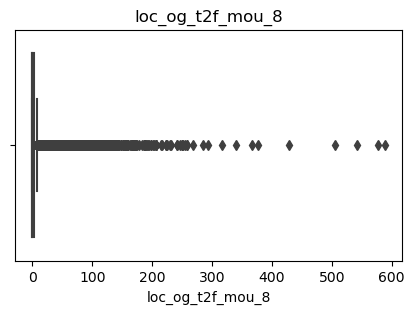

Data description: 
count    69999.000000
mean         3.661652
std         12.660414
min          0.000000
25%          0.000000
50%          0.000000
75%          3.060000
80%          3.661652
90%          8.730000
95%         17.341000
97%         26.210000
99%         53.380200
max        588.290000
Name: loc_og_t2f_mou_8, dtype: float64


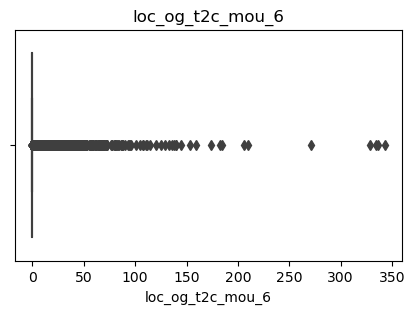

Data description: 
count    69999.000000
mean         1.126025
std          5.627139
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.400000
90%          2.252000
95%          6.130000
97%          9.550000
99%         19.710600
max        342.860000
Name: loc_og_t2c_mou_6, dtype: float64


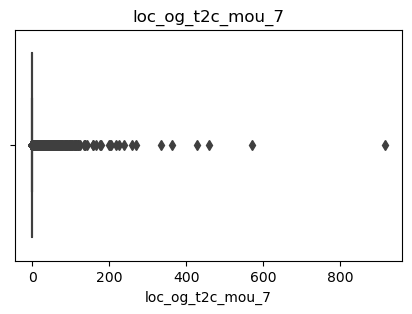

Data description: 
count    69999.000000
mean         1.361052
std          7.760728
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.650000
90%          2.810000
95%          7.060000
97%         11.010000
99%         23.130600
max        916.240000
Name: loc_og_t2c_mou_7, dtype: float64


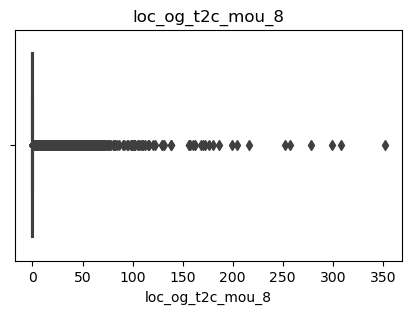

Data description: 
count    69999.000000
mean         1.420840
std          6.366805
min          0.000000
25%          0.000000
50%          0.000000
75%          0.150000
80%          1.180000
90%          3.110000
95%          7.490000
97%         11.700000
99%         23.590800
max        351.830000
Name: loc_og_t2c_mou_8, dtype: float64


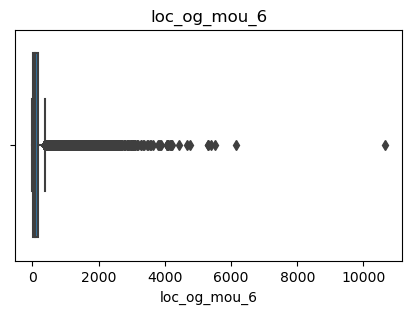

Data description: 
count    69999.000000
mean       143.893585
std        247.001108
min          0.000000
25%         18.730000
50%         70.680000
75%        161.485000
80%        201.280000
90%        346.314000
95%        527.918000
97%        686.786600
99%       1133.692000
max      10643.380000
Name: loc_og_mou_6, dtype: float64


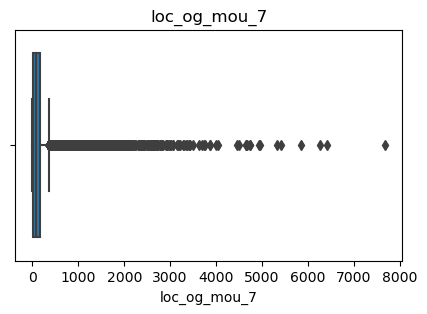

Data description: 
count    69999.000000
mean       140.750120
std        241.539298
min          0.000000
25%         18.950000
50%         68.390000
75%        157.740000
80%        196.798000
90%        337.130000
95%        517.942000
97%        677.343000
99%       1113.267400
max       7674.780000
Name: loc_og_mou_7, dtype: float64


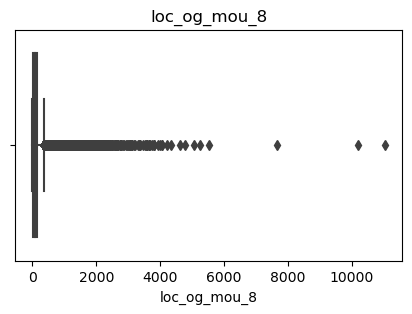

Data description: 
count    69999.000000
mean       140.476486
std        238.764694
min          0.000000
25%         19.240000
50%         70.510000
75%        156.980000
80%        195.248000
90%        335.660000
95%        513.236000
97%        669.439000
99%       1089.510400
max      11039.910000
Name: loc_og_mou_8, dtype: float64


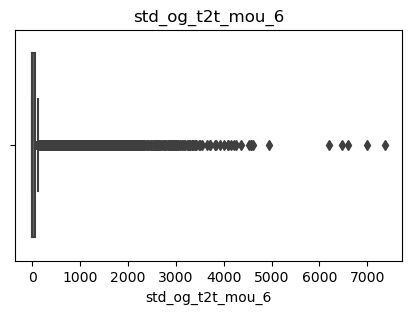

Data description: 
count    69999.000000
mean        80.619382
std        250.003679
min          0.000000
25%          0.000000
50%          0.000000
75%         46.210000
80%         80.619382
90%        204.840000
95%        448.486000
97%        681.104000
99%       1211.935200
max       7366.580000
Name: std_og_t2t_mou_6, dtype: float64


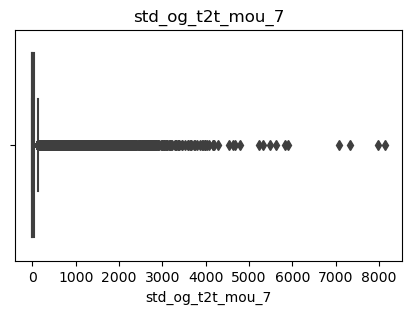

Data description: 
count    69999.000000
mean        83.775851
std        261.524413
min          0.000000
25%          0.000000
50%          0.000000
75%         46.550000
80%         83.775851
90%        212.976000
95%        481.477000
97%        701.935200
99%       1258.333000
max       8133.660000
Name: std_og_t2t_mou_7, dtype: float64


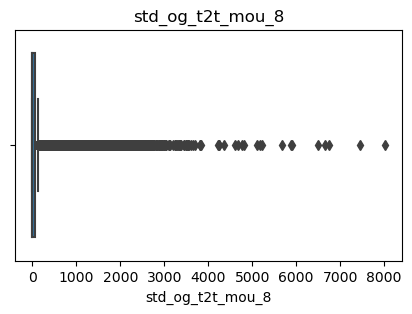

Data description: 
count    69999.000000
mean        83.471486
std        259.863031
min          0.000000
25%          0.000000
50%          0.000000
75%         53.410000
80%         83.471486
90%        209.376000
95%        466.443000
97%        691.382800
99%       1248.485600
max       8014.430000
Name: std_og_t2t_mou_8, dtype: float64


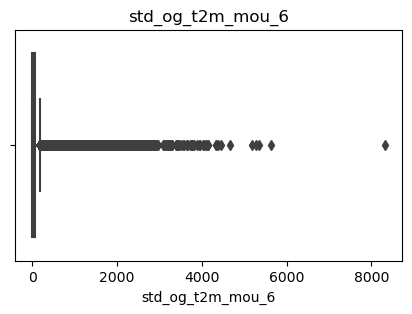

Data description: 
count    69999.000000
mean        88.152110
std        250.663432
min          0.000000
25%          0.000000
50%          5.330000
75%         71.190000
80%         88.152110
90%        226.130000
95%        448.681000
97%        658.746000
99%       1229.355800
max       8314.760000
Name: std_og_t2m_mou_6, dtype: float64


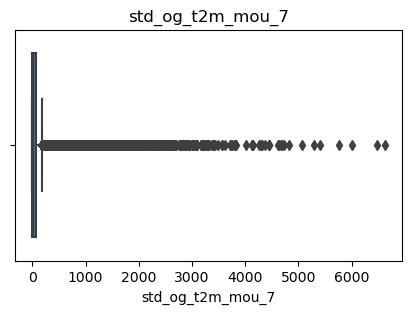

Data description: 
count    69999.000000
mean        91.538615
std        262.346990
min          0.000000
25%          0.000000
50%          4.960000
75%         72.275000
80%         91.538615
90%        236.964000
95%        469.360000
97%        686.880600
99%       1252.291400
max       6622.540000
Name: std_og_t2m_mou_7, dtype: float64


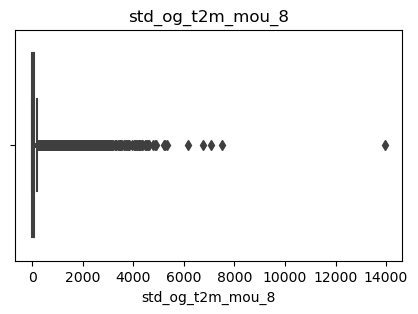

Data description: 
count    69999.000000
mean        90.586999
std        262.792404
min          0.000000
25%          0.000000
50%          5.130000
75%         79.620000
80%         90.586999
90%        232.998000
95%        466.181000
97%        677.596000
99%       1214.253000
max      13950.040000
Name: std_og_t2m_mou_8, dtype: float64


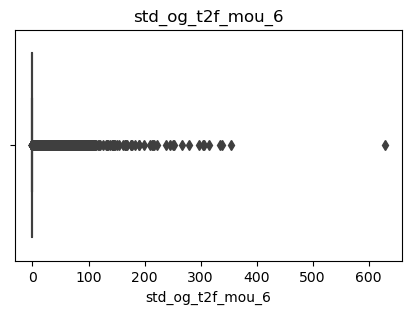

Data description: 
count    69999.000000
mean         1.126377
std          7.974145
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          1.126377
95%          4.060000
97%          8.480000
99%         24.750200
max        628.560000
Name: std_og_t2f_mou_6, dtype: float64


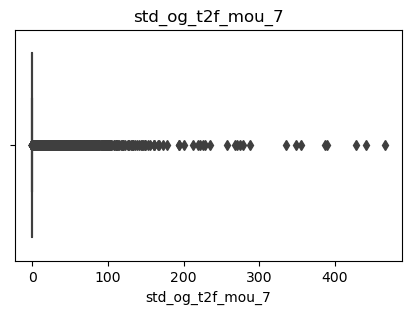

Data description: 
count    69999.000000
mean         1.084062
std          8.163853
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          1.084062
95%          3.610000
97%          7.810000
99%         23.731600
max        465.790000
Name: std_og_t2f_mou_7, dtype: float64


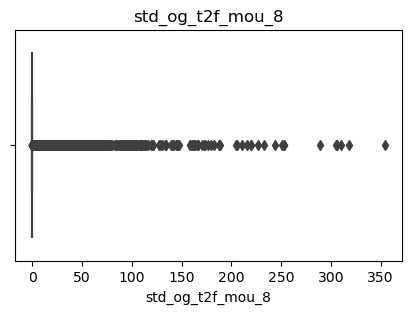

Data description: 
count    69999.000000
mean         1.057739
std          7.490499
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          1.057739
95%          3.500000
97%          7.661200
99%         22.930200
max        354.160000
Name: std_og_t2f_mou_8, dtype: float64


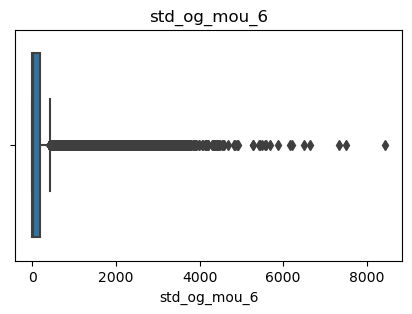

Data description: 
count    69999.000000
mean       169.900601
std        384.216872
min          0.000000
25%          0.000000
50%         14.990000
75%        169.900601
80%        210.980000
90%        511.176000
95%        865.083000
97%       1164.261200
99%       1856.658800
max       8432.990000
Name: std_og_mou_6, dtype: float64


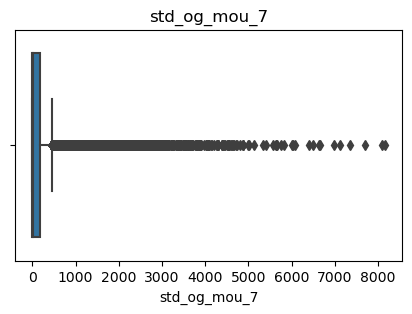

Data description: 
count    69999.000000
mean       176.401217
std        401.366777
min          0.000000
25%          0.000000
50%         14.210000
75%        176.401217
80%        219.084000
90%        537.254000
95%        903.583000
97%       1194.760000
99%       1891.854600
max       8155.530000
Name: std_og_mou_7, dtype: float64


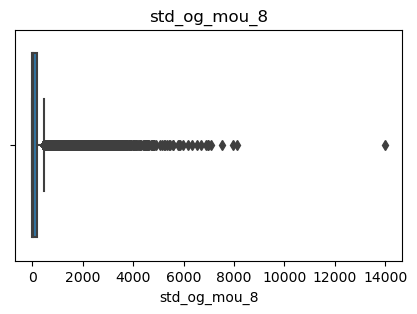

Data description: 
count    69999.000000
mean       175.118852
std        399.686248
min          0.000000
25%          0.000000
50%         14.660000
75%        175.118852
80%        211.206000
90%        526.412000
95%        893.897000
97%       1176.486600
99%       1882.536800
max      13980.060000
Name: std_og_mou_8, dtype: float64


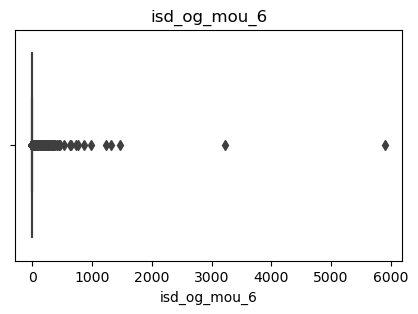

Data description: 
count    69999.000000
mean         0.845763
std         29.153386
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.000000
95%          0.845763
97%          0.845763
99%          7.790800
max       5900.660000
Name: isd_og_mou_6, dtype: float64


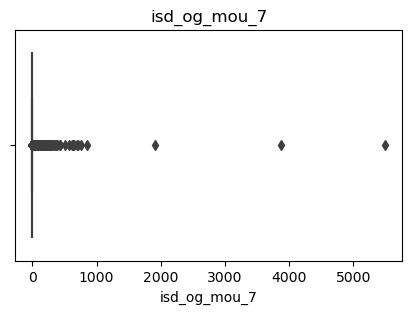

Data description: 
count    69999.000000
mean         0.811100
std         28.653753
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.000000
95%          0.811100
97%          0.811100
99%          7.910400
max       5490.280000
Name: isd_og_mou_7, dtype: float64


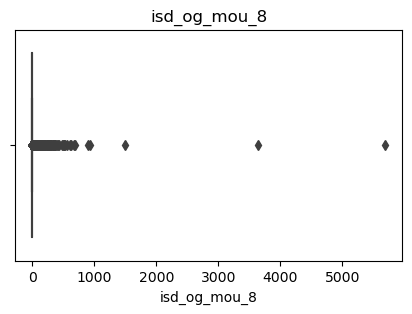

Data description: 
count    69999.000000
mean         0.841648
std         28.770768
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.000000
95%          0.841648
97%          0.841648
99%          6.260400
max       5681.540000
Name: isd_og_mou_8, dtype: float64


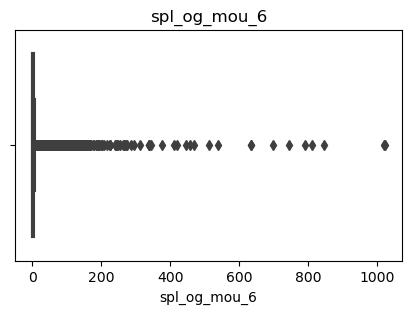

Data description: 
count    69999.000000
mean         3.958619
std         15.537891
min          0.000000
25%          0.000000
50%          0.000000
75%          3.360000
80%          3.958619
90%         10.230000
95%         18.930000
97%         26.680000
99%         50.630200
max       1023.210000
Name: spl_og_mou_6, dtype: float64


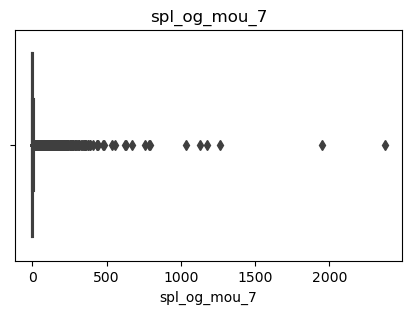

Data description: 
count    69999.000000
mean         4.976783
std         21.799000
min          0.000000
25%          0.000000
50%          0.000000
75%          4.740000
80%          5.230000
90%         12.530000
95%         22.710000
97%         31.461200
99%         59.710400
max       2372.510000
Name: spl_og_mou_7, dtype: float64


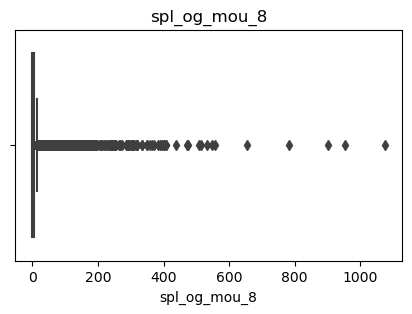

Data description: 
count    69999.000000
mean         5.045027
std         17.233739
min          0.000000
25%          0.000000
50%          0.130000
75%          5.045027
80%          5.440000
90%         12.910000
95%         22.951000
97%         32.040000
99%         58.890000
max       1075.080000
Name: spl_og_mou_8, dtype: float64


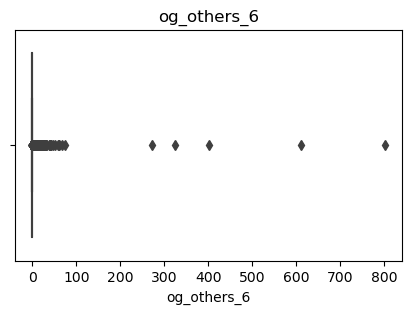

Data description: 
count    69999.000000
mean         0.462581
std          4.673205
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.210000
90%          1.180000
95%          2.610000
97%          3.860000
99%          6.830200
max        800.890000
Name: og_others_6, dtype: float64


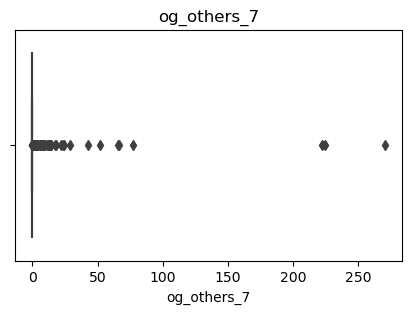

Data description: 
count    69999.000000
mean         0.024425
std          1.683163
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.000000
95%          0.000000
97%          0.024425
99%          0.024425
max        270.240000
Name: og_others_7, dtype: float64


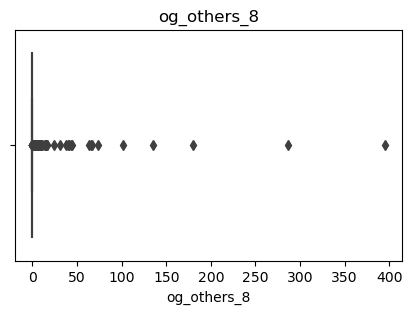

Data description: 
count    69999.000000
mean         0.033059
std          2.172692
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.000000
95%          0.033059
97%          0.033059
99%          0.033059
max        394.930000
Name: og_others_8, dtype: float64


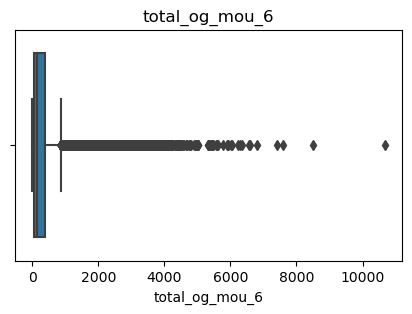

Data description: 
count    69999.000000
mean       306.451436
std        465.502866
min          0.000000
25%         44.780000
50%        145.280000
75%        374.305000
80%        464.642000
90%        785.230000
95%       1171.188000
97%       1477.823200
99%       2235.611000
max      10674.030000
Name: total_og_mou_6, dtype: float64


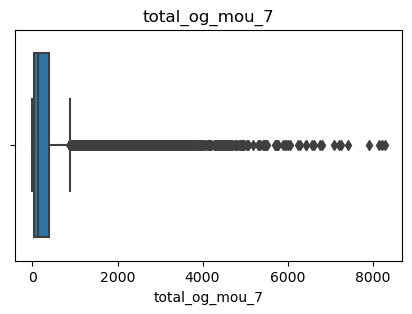

Data description: 
count    69999.000000
mean       310.572674
std        479.131770
min          0.000000
25%         42.910000
50%        141.230000
75%        380.045000
80%        470.972000
90%        806.250000
95%       1193.257000
97%       1505.941200
99%       2275.607000
max       8285.640000
Name: total_og_mou_7, dtype: float64


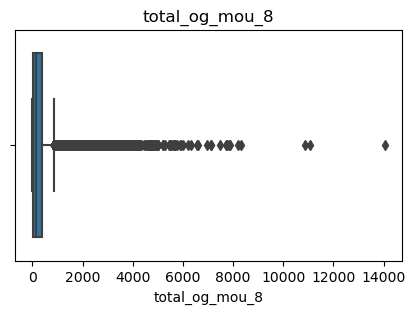

Data description: 
count    69999.000000
mean       304.513065
std        477.936832
min          0.000000
25%         38.710000
50%        138.360000
75%        370.895000
80%        463.390000
90%        792.858000
95%       1174.552000
97%       1482.045400
99%       2242.854800
max      14043.060000
Name: total_og_mou_8, dtype: float64


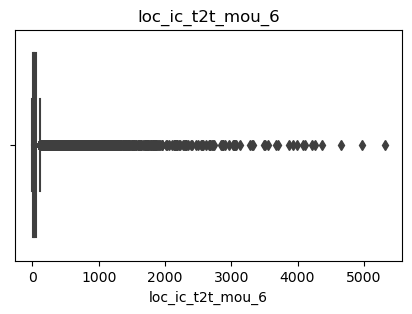

Data description: 
count    69999.000000
mean        48.043255
std        137.693777
min          0.000000
25%          3.360000
50%         17.310000
75%         48.043255
80%         57.040000
90%        104.294000
95%        169.073000
97%        237.019000
99%        477.644800
max       5315.590000
Name: loc_ic_t2t_mou_6, dtype: float64


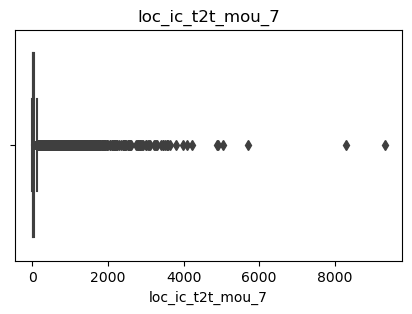

Data description: 
count    69999.000000
mean        47.882736
std        144.897333
min          0.000000
25%          3.580000
50%         17.360000
75%         47.882736
80%         55.684000
90%        102.848000
95%        169.040000
97%        233.572000
99%        471.136000
max       9324.660000
Name: loc_ic_t2t_mou_7, dtype: float64


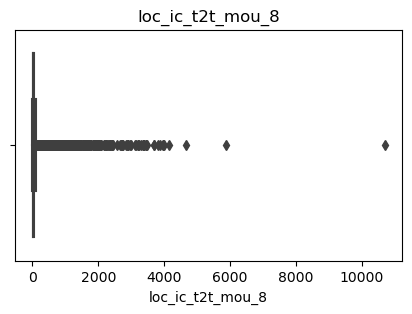

Data description: 
count    69999.000000
mean        47.256388
std        137.462451
min          0.000000
25%          3.740000
50%         18.110000
75%         47.256388
80%         55.560000
90%        100.914000
95%        164.949000
97%        228.184800
99%        451.663400
max      10696.230000
Name: loc_ic_t2t_mou_8, dtype: float64


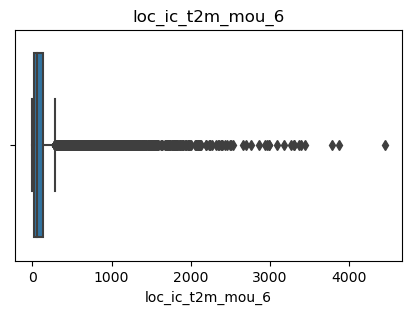

Data description: 
count    69999.000000
mean       107.152439
std        165.091693
min          0.000000
25%         18.610000
50%         60.840000
75%        127.280000
80%        154.930000
90%        248.382000
95%        363.912000
97%        468.160000
99%        748.741800
max       4450.740000
Name: loc_ic_t2m_mou_6, dtype: float64


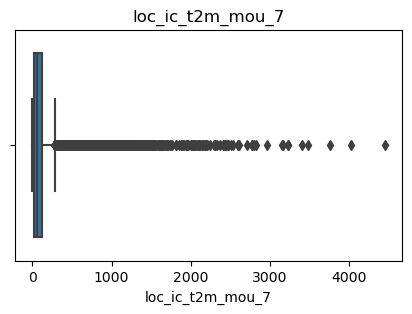

Data description: 
count    69999.000000
mean       106.489856
std        162.245788
min          0.000000
25%         19.790000
50%         60.860000
75%        126.610000
80%        153.660000
90%        246.194000
95%        358.131000
97%        461.480600
99%        741.080200
max       4455.830000
Name: loc_ic_t2m_mou_7, dtype: float64


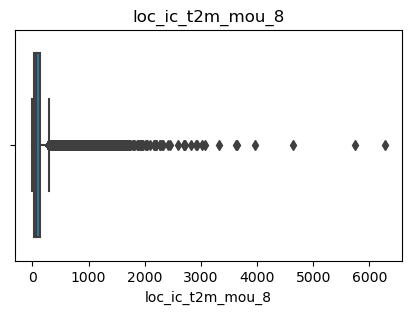

Data description: 
count    69999.000000
mean       108.154731
std        161.766985
min          0.000000
25%         20.680000
50%         63.910000
75%        127.800000
80%        154.840000
90%        247.110000
95%        361.631000
97%        468.619000
99%        748.064600
max       6274.190000
Name: loc_ic_t2m_mou_8, dtype: float64


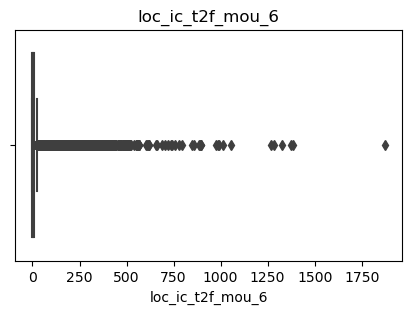

Data description: 
count    69999.000000
mean        12.050672
std         38.628881
min          0.000000
25%          0.000000
50%          1.130000
75%         10.340000
80%         12.050672
90%         28.844000
95%         54.940000
97%         81.430600
99%        161.811000
max       1872.340000
Name: loc_ic_t2f_mou_6, dtype: float64


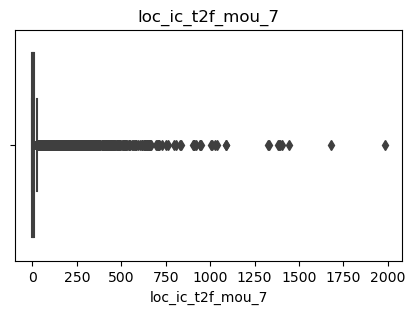

Data description: 
count    69999.000000
mean        12.563665
std         42.652189
min          0.000000
25%          0.000000
50%          1.160000
75%         10.360000
80%         12.563665
90%         29.180000
95%         56.912000
97%         84.460000
99%        170.710600
max       1983.010000
Name: loc_ic_t2f_mou_7, dtype: float64


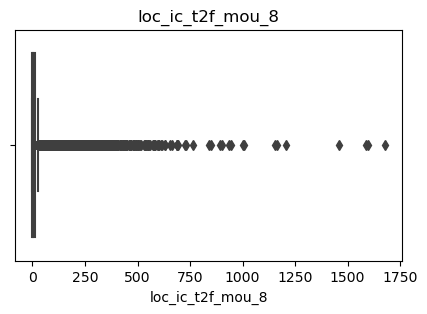

Data description: 
count    69999.000000
mean        11.716763
std         37.571838
min          0.000000
25%          0.000000
50%          1.250000
75%         11.135000
80%         11.716763
90%         26.944000
95%         53.040000
97%         78.042400
99%        153.244800
max       1676.580000
Name: loc_ic_t2f_mou_8, dtype: float64


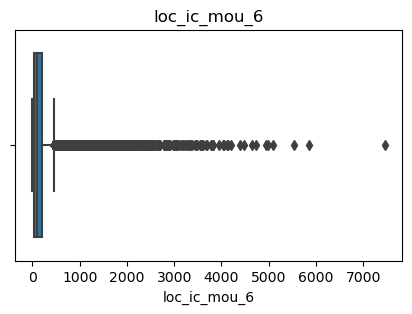

Data description: 
count    69999.000000
mean       167.255126
std        247.531924
min          0.000000
25%         32.685000
50%         98.940000
75%        200.690000
80%        241.898000
90%        383.174000
95%        557.122000
97%        702.439000
99%       1136.114600
max       7454.630000
Name: loc_ic_mou_6, dtype: float64


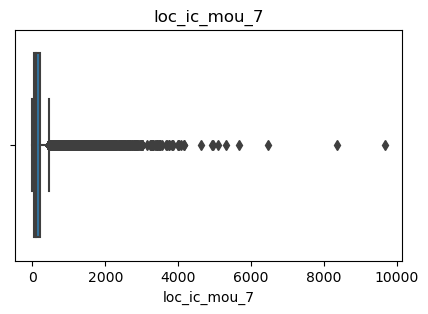

Data description: 
count    69999.000000
mean       166.945103
std        249.752539
min          0.000000
25%         34.660000
50%         98.630000
75%        198.410000
80%        239.434000
90%        379.632000
95%        551.963000
97%        700.611200
99%       1146.232400
max       9669.910000
Name: loc_ic_mou_7, dtype: float64


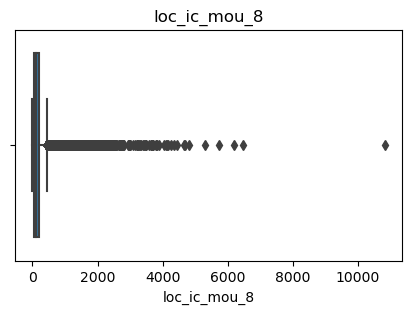

Data description: 
count    69999.000000
mean       167.136761
std        242.604951
min          0.000000
25%         35.470000
50%        102.590000
75%        198.000000
80%        238.268000
90%        377.030000
95%        552.890000
97%        696.711800
99%       1121.214400
max      10830.160000
Name: loc_ic_mou_8, dtype: float64


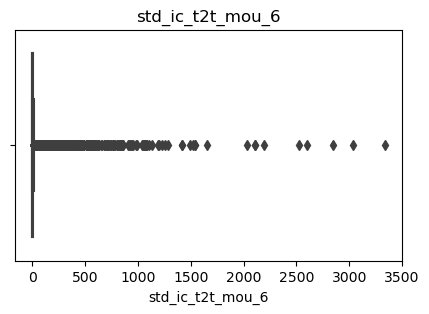

Data description: 
count    69999.000000
mean         9.476958
std         50.632659
min          0.000000
25%          0.000000
50%          0.000000
75%          5.610000
80%          9.476958
90%         19.080000
95%         39.492000
97%         60.842400
99%        135.995800
max       3336.380000
Name: std_ic_t2t_mou_6, dtype: float64


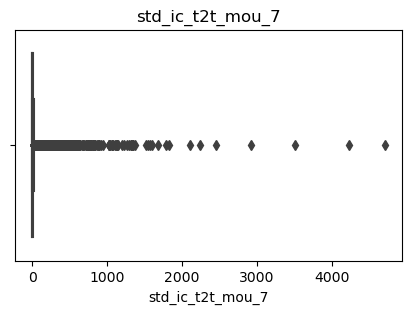

Data description: 
count    69999.000000
mean         9.873468
std         55.049805
min          0.000000
25%          0.000000
50%          0.000000
75%          5.730000
80%          9.860000
90%         19.660000
95%         40.442000
97%         62.380600
99%        146.782600
max       4708.710000
Name: std_ic_t2t_mou_7, dtype: float64


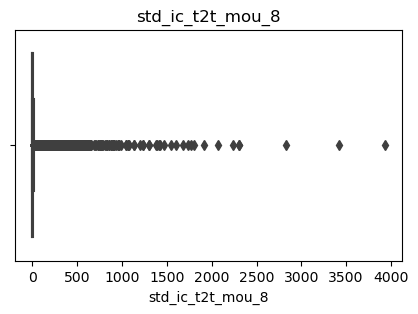

Data description: 
count    69999.000000
mean         9.910217
std         52.793785
min          0.000000
25%          0.000000
50%          0.000000
75%          6.430000
80%          9.910217
90%         19.030000
95%         40.080000
97%         62.090000
99%        145.940800
max       3930.240000
Name: std_ic_t2t_mou_8, dtype: float64


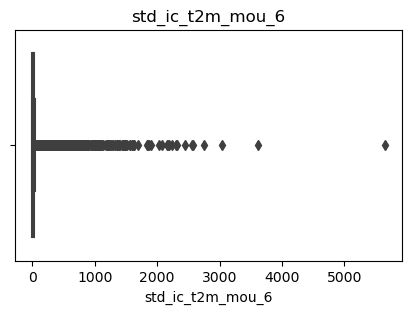

Data description: 
count    69999.000000
mean        20.734858
std         78.690646
min          0.000000
25%          0.000000
50%          2.540000
75%         18.560000
80%         20.734858
90%         45.810000
95%         83.980000
97%        123.311800
99%        264.668000
max       5647.160000
Name: std_ic_t2m_mou_6, dtype: float64


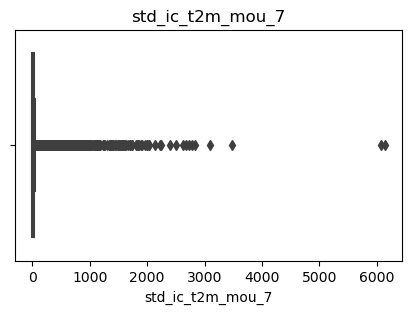

Data description: 
count    69999.000000
mean        21.685359
std         85.622248
min          0.000000
25%          0.000000
50%          2.580000
75%         19.330000
80%         21.685359
90%         47.840000
95%         87.381000
97%        128.763000
99%        274.182200
max       6141.880000
Name: std_ic_t2m_mou_7, dtype: float64


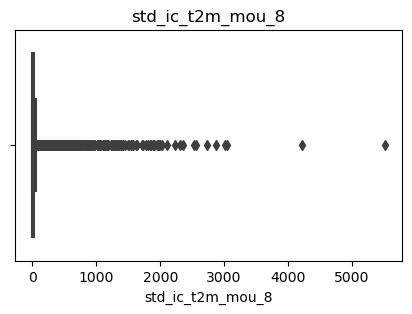

Data description: 
count    69999.000000
mean        21.089042
std         79.348397
min          0.000000
25%          0.000000
50%          2.700000
75%         20.710000
80%         21.089042
90%         46.286000
95%         84.860000
97%        125.189000
99%        273.764400
max       5512.760000
Name: std_ic_t2m_mou_8, dtype: float64


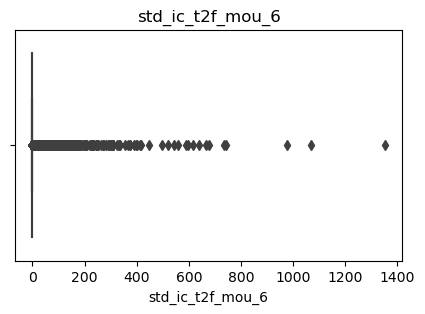

Data description: 
count    69999.000000
mean         2.146273
std         16.192259
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.610000
90%          2.500000
95%          8.062000
97%         14.710000
99%         39.384200
max       1351.110000
Name: std_ic_t2f_mou_6, dtype: float64


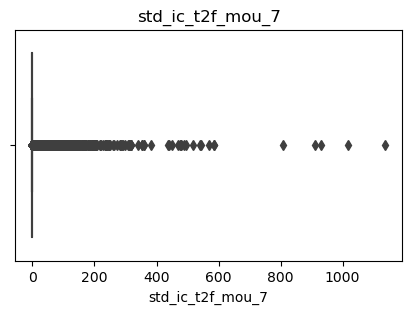

Data description: 
count    69999.000000
mean         2.199395
std         15.858109
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.630000
90%          2.560000
95%          8.130000
97%         14.910000
99%         41.290800
max       1136.080000
Name: std_ic_t2f_mou_7, dtype: float64


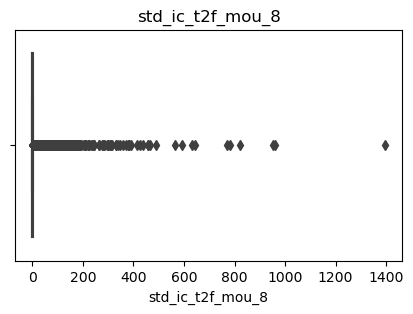

Data description: 
count    69999.000000
mean         2.075179
std         15.440049
min          0.000000
25%          0.000000
50%          0.000000
75%          0.180000
80%          0.910000
90%          2.502000
95%          7.650000
97%         14.150600
99%         37.260000
max       1394.890000
Name: std_ic_t2f_mou_8, dtype: float64


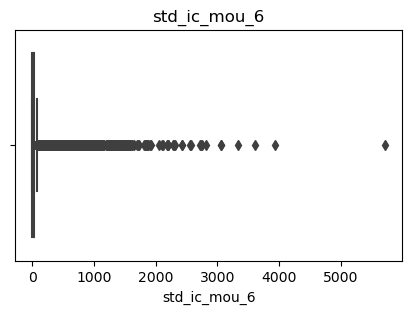

Data description: 
count    69999.000000
mean        32.360632
std        102.296444
min          0.000000
25%          0.110000
50%          6.850000
75%         32.010000
80%         34.260000
90%         73.030000
95%        128.847000
97%        187.440800
99%        389.595600
max       5712.110000
Name: std_ic_mou_6, dtype: float64


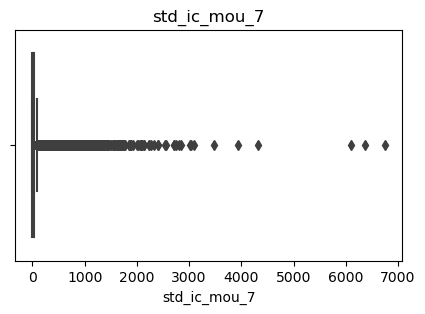

Data description: 
count    69999.000000
mean        33.760809
std        111.930014
min          0.000000
25%          0.080000
50%          6.940000
75%         33.640000
80%         36.140000
90%         75.482000
95%        134.880000
97%        193.490800
99%        411.881000
max       6745.760000
Name: std_ic_mou_7, dtype: float64


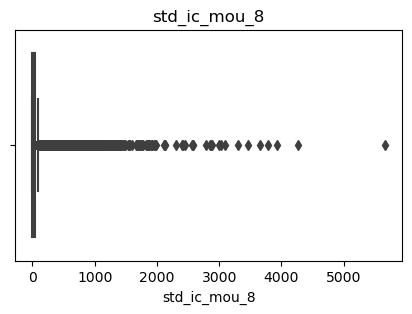

Data description: 
count    69999.000000
mean        33.077030
std        105.561771
min          0.000000
25%          0.190000
50%          7.080000
75%         33.077030
80%         35.030000
90%         73.030000
95%        130.590000
97%        191.781800
99%        397.688600
max       5658.740000
Name: std_ic_mou_8, dtype: float64


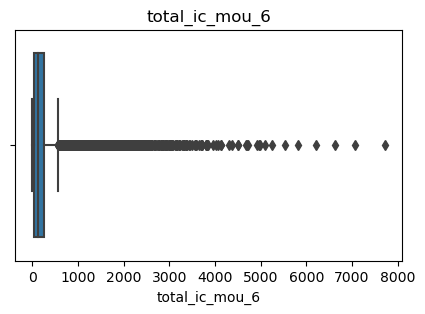

Data description: 
count    69999.000000
mean       199.710640
std        290.114823
min          0.000000
25%         38.640000
50%        114.780000
75%        251.070000
80%        298.560000
90%        467.030000
95%        668.240000
97%        851.503200
99%       1366.030000
max       7716.140000
Name: total_ic_mou_6, dtype: float64


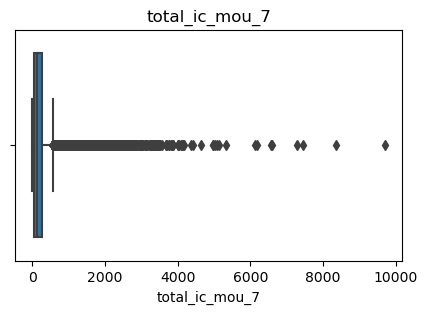

Data description: 
count    69999.000000
mean       201.878029
std        296.771338
min          0.000000
25%         41.340000
50%        116.330000
75%        249.470000
80%        297.722000
90%        468.524000
95%        676.904000
97%        863.380000
99%       1382.071400
max       9699.010000
Name: total_ic_mou_7, dtype: float64


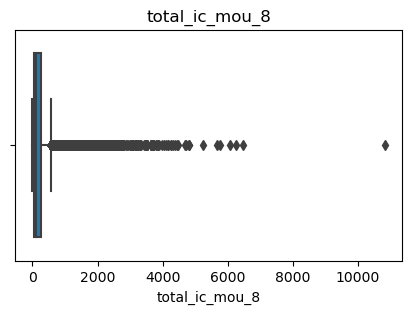

Data description: 
count    69999.000000
mean       198.486034
std        288.336731
min          0.000000
25%         38.290000
50%        114.610000
75%        249.710000
80%        297.440000
90%        464.508000
95%        665.435000
97%        852.513000
99%       1353.297000
max      10830.380000
Name: total_ic_mou_8, dtype: float64


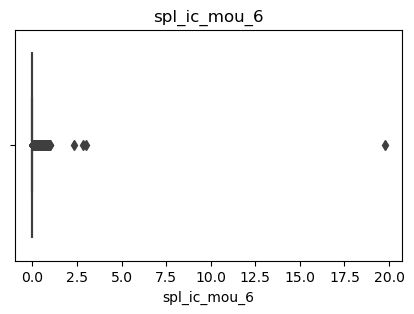

Data description: 
count    69999.000000
mean         0.061932
std          0.161531
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.061932
90%          0.260000
95%          0.410000
97%          0.490000
99%          0.640000
max         19.760000
Name: spl_ic_mou_6, dtype: float64


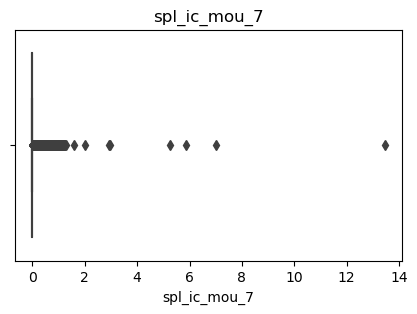

Data description: 
count    69999.000000
mean         0.033371
std          0.134660
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.050000
95%          0.230000
97%          0.380000
99%          0.630000
max         13.460000
Name: spl_ic_mou_7, dtype: float64


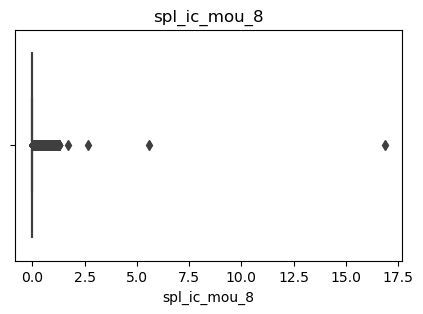

Data description: 
count    69999.000000
mean         0.040392
std          0.144438
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.100000
95%          0.300000
97%          0.460000
99%          0.680000
max         16.860000
Name: spl_ic_mou_8, dtype: float64


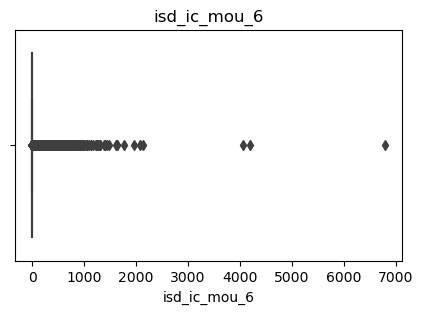

Data description: 
count    69999.000000
mean         7.394167
std         59.733884
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          7.394167
95%         22.640000
97%         48.831800
99%        159.120600
max       6789.410000
Name: isd_ic_mou_6, dtype: float64


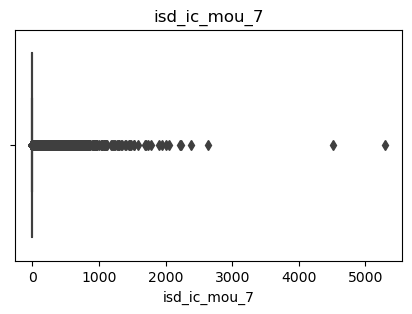

Data description: 
count    69999.000000
mean         8.171162
std         62.371439
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.010000
90%          8.171162
95%         26.594000
97%         53.013000
99%        168.592800
max       5289.540000
Name: isd_ic_mou_7, dtype: float64


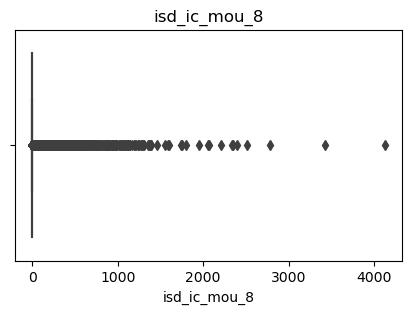

Data description: 
count    69999.000000
mean         8.348424
std         61.405914
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.260000
90%          8.348424
95%         27.213000
97%         55.230600
99%        169.242400
max       4127.010000
Name: isd_ic_mou_8, dtype: float64


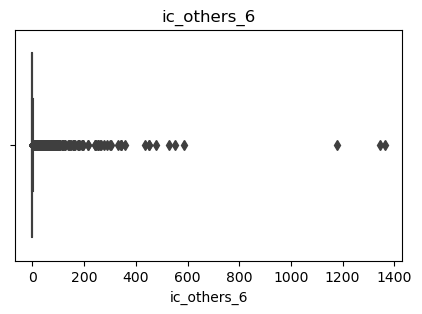

Data description: 
count    69999.000000
mean         0.854063
std         11.906508
min          0.000000
25%          0.000000
50%          0.000000
75%          0.050000
80%          0.210000
90%          0.854063
95%          2.000000
97%          4.080000
99%         14.380600
max       1362.940000
Name: ic_others_6, dtype: float64


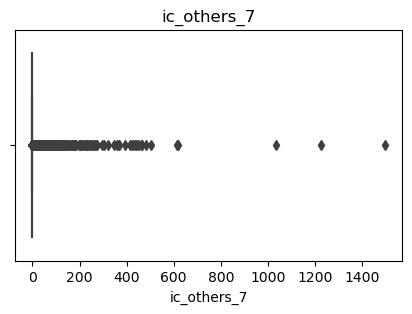

Data description: 
count    69999.000000
mean         1.019680
std         12.969049
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.180000
90%          1.019680
95%          2.480000
97%          5.160000
99%         16.210600
max       1495.940000
Name: ic_others_7, dtype: float64


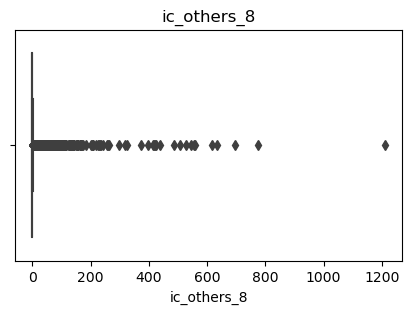

Data description: 
count    69999.000000
mean         0.963214
std         11.384069
min          0.000000
25%          0.000000
50%          0.000000
75%          0.080000
80%          0.280000
90%          0.963214
95%          2.230000
97%          4.560000
99%         15.500200
max       1209.860000
Name: ic_others_8, dtype: float64


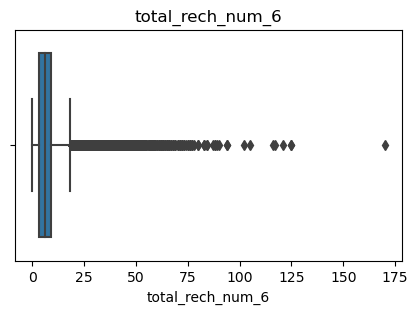

Data description: 
count    69999.000000
mean         7.566522
std          7.041452
min          0.000000
25%          3.000000
50%          6.000000
75%          9.000000
80%         11.000000
90%         15.000000
95%         20.000000
97%         25.000000
99%         35.000000
max        170.000000
Name: total_rech_num_6, dtype: float64


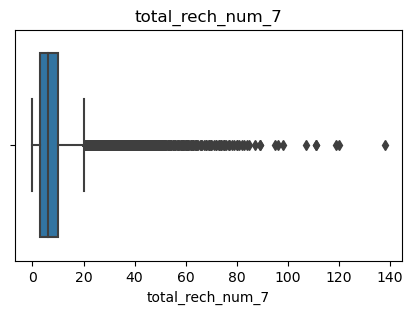

Data description: 
count    69999.000000
mean         7.706667
std          7.050614
min          0.000000
25%          3.000000
50%          6.000000
75%         10.000000
80%         11.000000
90%         15.000000
95%         21.000000
97%         25.000000
99%         35.000000
max        138.000000
Name: total_rech_num_7, dtype: float64


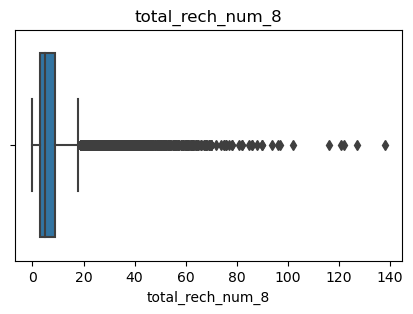

Data description: 
count    69999.000000
mean         7.224932
std          7.195597
min          0.000000
25%          3.000000
50%          5.000000
75%          9.000000
80%         11.000000
90%         15.000000
95%         20.000000
97%         25.000000
99%         35.000000
max        138.000000
Name: total_rech_num_8, dtype: float64


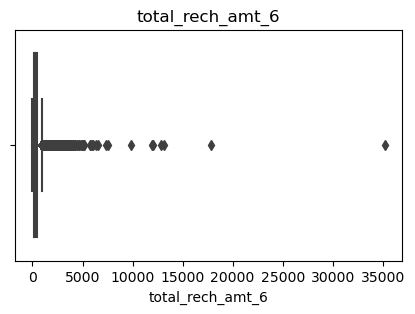

Data description: 
count    69999.000000
mean       328.139788
std        404.211068
min          0.000000
25%        110.000000
50%        229.000000
75%        438.000000
80%        504.000000
90%        735.000000
95%        998.000000
97%       1187.000000
99%       1683.020000
max      35190.000000
Name: total_rech_amt_6, dtype: float64


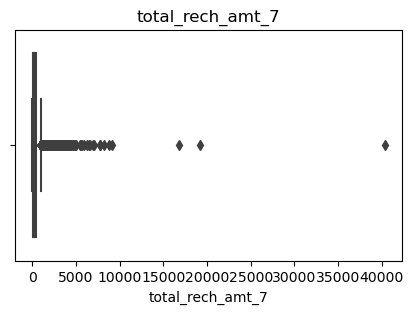

Data description: 
count    69999.000000
mean       322.376363
std        411.070120
min          0.000000
25%        100.000000
50%        220.000000
75%        430.000000
80%        500.000000
90%        730.000000
95%        986.100000
97%       1186.000000
99%       1712.000000
max      40335.000000
Name: total_rech_amt_7, dtype: float64


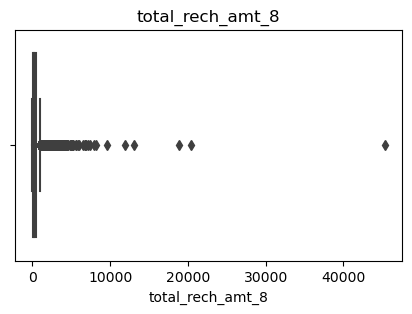

Data description: 
count    69999.000000
mean       323.846355
std        426.181405
min          0.000000
25%         90.000000
50%        225.000000
75%        436.000000
80%        504.000000
90%        734.000000
95%        988.000000
97%       1187.000000
99%       1706.020000
max      45320.000000
Name: total_rech_amt_8, dtype: float64


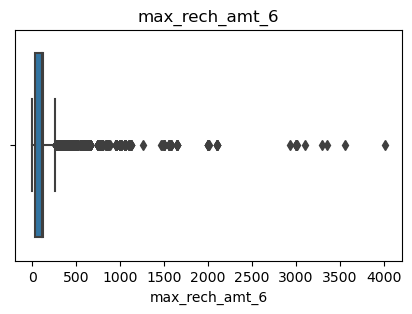

Data description: 
count    69999.000000
mean       104.569265
std        121.407701
min          0.000000
25%         30.000000
50%        110.000000
75%        120.000000
80%        145.000000
90%        200.000000
95%        252.000000
97%        339.000000
99%        550.000000
max       4010.000000
Name: max_rech_amt_6, dtype: float64


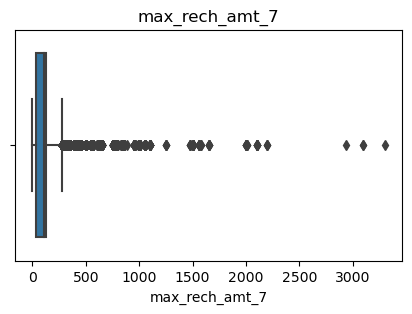

Data description: 
count    69999.000000
mean       104.137573
std        120.782543
min          0.000000
25%         30.000000
50%        110.000000
75%        128.000000
80%        150.000000
90%        200.000000
95%        252.000000
97%        339.000000
99%        550.000000
max       3299.000000
Name: max_rech_amt_7, dtype: float64


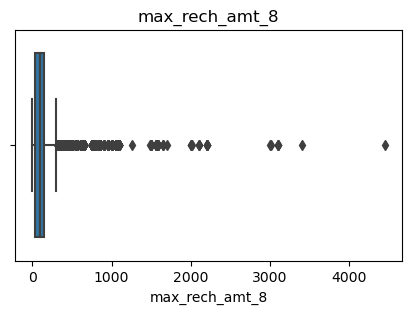

Data description: 
count    69999.000000
mean       107.540351
std        124.396750
min          0.000000
25%         30.000000
50%         98.000000
75%        144.000000
80%        150.000000
90%        225.000000
95%        252.000000
97%        350.000000
99%        550.000000
max       4449.000000
Name: max_rech_amt_8, dtype: float64


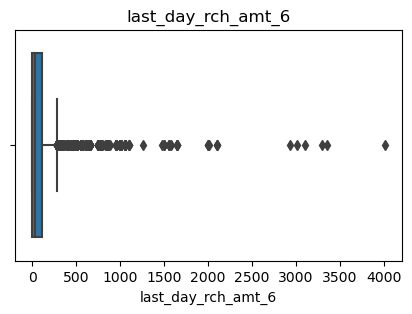

Data description: 
count    69999.000000
mean        63.426949
std         97.954876
min          0.000000
25%          0.000000
50%         30.000000
75%        110.000000
80%        110.000000
90%        128.000000
95%        200.000000
97%        252.000000
99%        400.000000
max       4010.000000
Name: last_day_rch_amt_6, dtype: float64


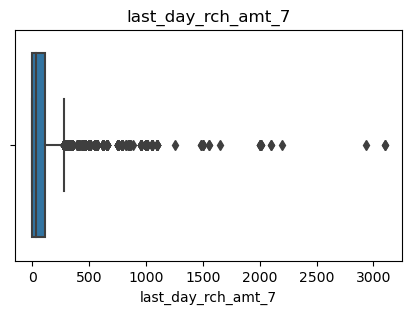

Data description: 
count    69999.000000
mean        59.294218
std         95.429492
min          0.000000
25%          0.000000
50%         30.000000
75%        110.000000
80%        110.000000
90%        130.000000
95%        200.000000
97%        250.000000
99%        398.000000
max       3100.000000
Name: last_day_rch_amt_7, dtype: float64


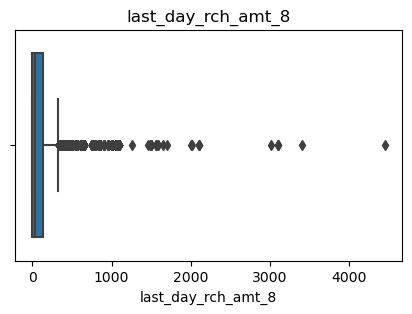

Data description: 
count    69999.000000
mean        62.489478
std        101.996729
min          0.000000
25%          0.000000
50%         30.000000
75%        130.000000
80%        130.000000
90%        150.000000
95%        225.000000
97%        252.000000
99%        455.000000
max       4449.000000
Name: last_day_rch_amt_8, dtype: float64


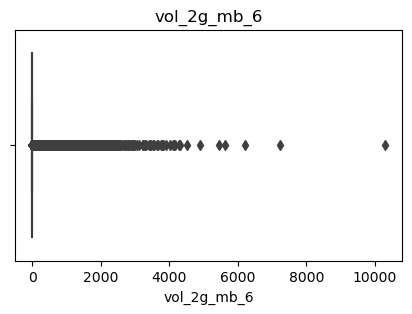

Data description: 
count    69999.000000
mean        51.773924
std        212.513909
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          2.650000
90%        103.514000
95%        327.241000
97%        531.119600
99%        995.815200
max      10285.900000
Name: vol_2g_mb_6, dtype: float64


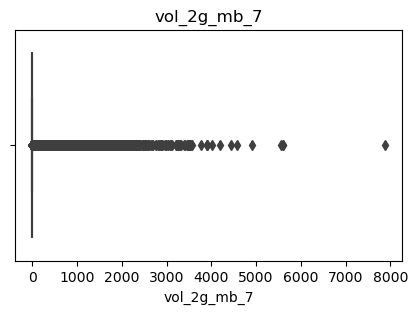

Data description: 
count    69999.000000
mean        51.240204
std        211.114667
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          3.040000
90%         97.410000
95%        318.672000
97%        514.550800
99%        999.260200
max       7873.550000
Name: vol_2g_mb_7, dtype: float64


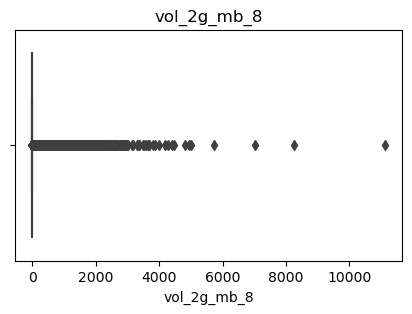

Data description: 
count    69999.000000
mean        50.127506
std        213.101403
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          3.670000
90%         93.290000
95%        302.284000
97%        504.601800
99%        986.360000
max      11117.610000
Name: vol_2g_mb_8, dtype: float64


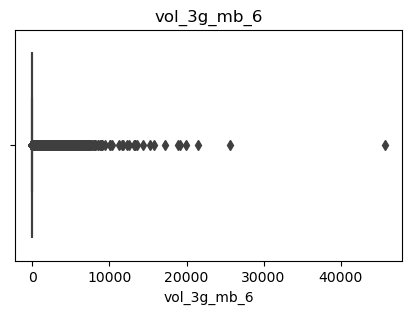

Data description: 
count    69999.000000
mean       122.171882
std        554.869965
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%        302.810000
95%        831.189000
97%       1164.677800
99%       2179.583200
max      45735.400000
Name: vol_3g_mb_6, dtype: float64


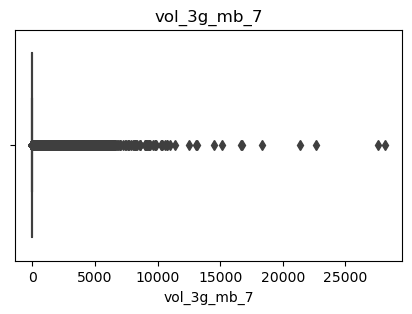

Data description: 
count    69999.000000
mean       128.934444
std        554.096072
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%        335.372000
95%        866.464000
97%       1228.932400
99%       2235.606000
max      28144.120000
Name: vol_3g_mb_7, dtype: float64


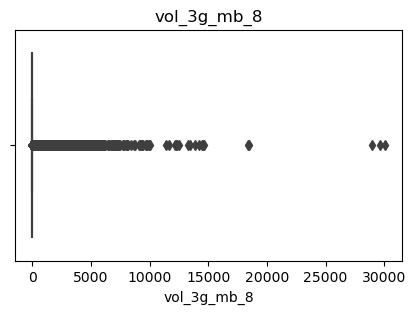

Data description: 
count    69999.000000
mean       135.486541
std        568.310234
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%        372.540000
95%        899.073000
97%       1266.401600
99%       2327.368000
max      30036.060000
Name: vol_3g_mb_8, dtype: float64


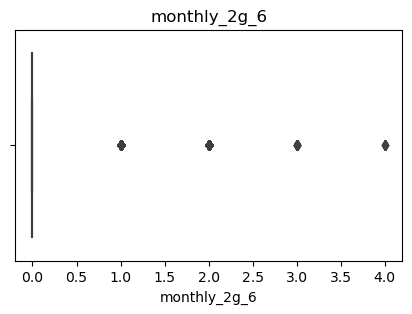

Data description: 
count    69999.000000
mean         0.079287
std          0.294719
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.000000
95%          1.000000
97%          1.000000
99%          1.000000
max          4.000000
Name: monthly_2g_6, dtype: float64


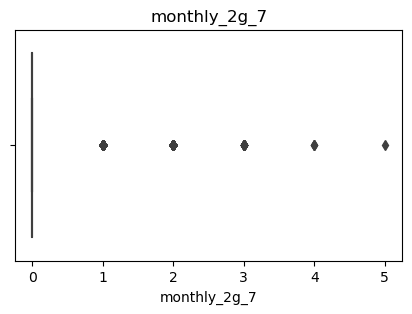

Data description: 
count    69999.000000
mean         0.083401
std          0.304802
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.000000
95%          1.000000
97%          1.000000
99%          1.000000
max          5.000000
Name: monthly_2g_7, dtype: float64


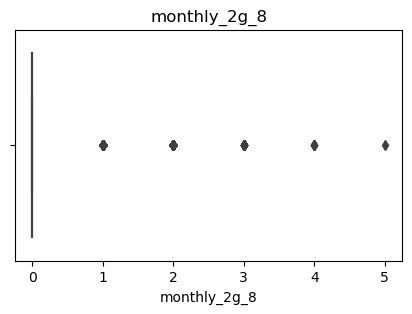

Data description: 
count    69999.000000
mean         0.080930
std          0.299254
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.000000
95%          1.000000
97%          1.000000
99%          1.000000
max          5.000000
Name: monthly_2g_8, dtype: float64


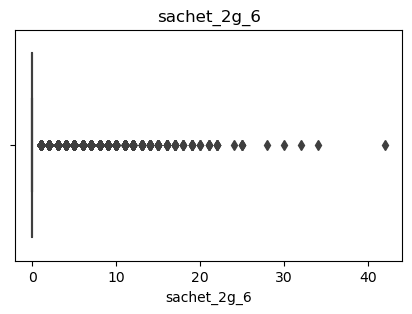

Data description: 
count    69999.000000
mean         0.388863
std          1.494206
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          1.000000
95%          2.000000
97%          4.000000
99%          8.000000
max         42.000000
Name: sachet_2g_6, dtype: float64


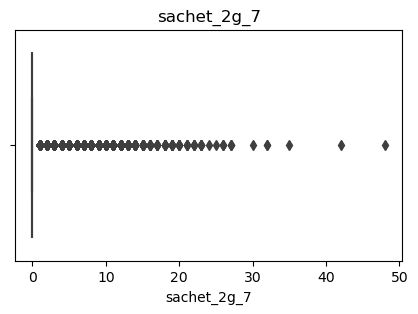

Data description: 
count    69999.000000
mean         0.441406
std          1.651012
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          1.000000
95%          3.000000
97%          5.000000
99%          9.000000
max         48.000000
Name: sachet_2g_7, dtype: float64


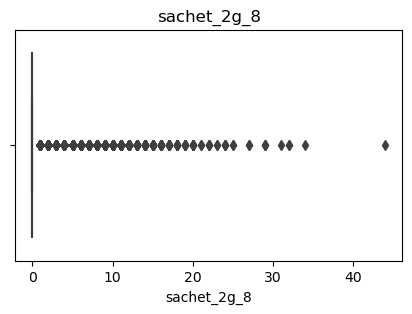

Data description: 
count    69999.000000
mean         0.449492
std          1.632450
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          1.000000
95%          3.000000
97%          5.000000
99%          8.000000
max         44.000000
Name: sachet_2g_8, dtype: float64


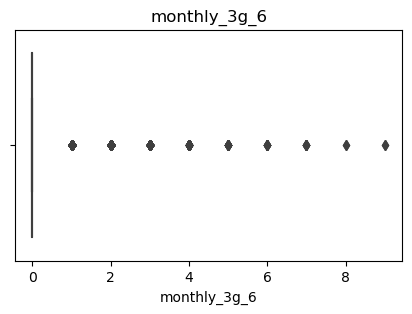

Data description: 
count    69999.000000
mean         0.075815
std          0.358905
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.000000
95%          1.000000
97%          1.000000
99%          2.000000
max          9.000000
Name: monthly_3g_6, dtype: float64


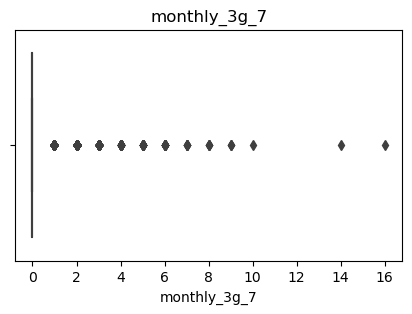

Data description: 
count    69999.000000
mean         0.077730
std          0.383189
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.000000
95%          1.000000
97%          1.000000
99%          2.000000
max         16.000000
Name: monthly_3g_7, dtype: float64


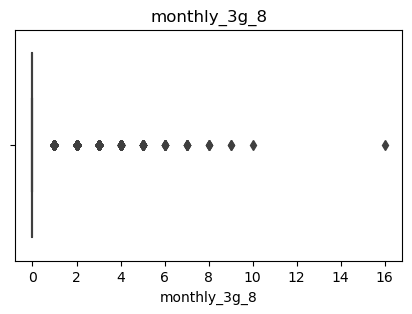

Data description: 
count    69999.000000
mean         0.081958
std          0.381821
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.000000
95%          1.000000
97%          1.000000
99%          2.000000
max         16.000000
Name: monthly_3g_8, dtype: float64


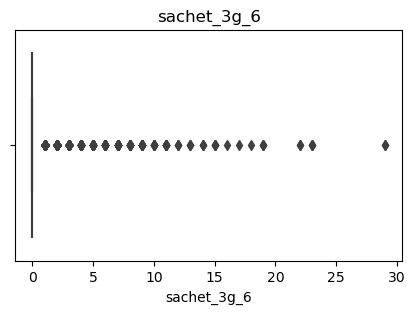

Data description: 
count    69999.000000
mean         0.075344
std          0.573003
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.000000
95%          0.000000
97%          1.000000
99%          2.000000
max         29.000000
Name: sachet_3g_6, dtype: float64


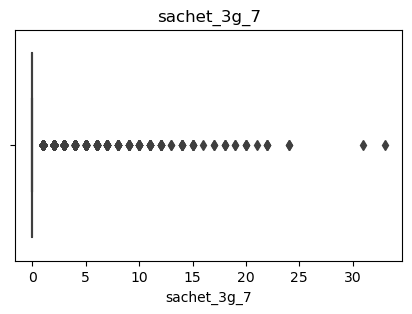

Data description: 
count    69999.000000
mean         0.081444
std          0.634547
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.000000
95%          0.000000
97%          1.000000
99%          2.000000
max         33.000000
Name: sachet_3g_7, dtype: float64


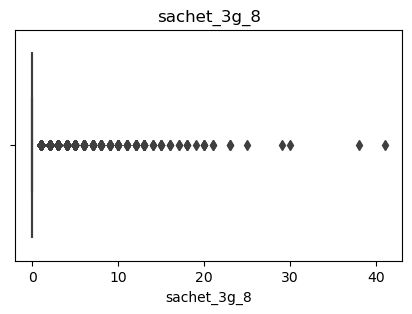

Data description: 
count    69999.000000
mean         0.085487
std          0.680035
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%          0.000000
95%          0.000000
97%          1.000000
99%          2.000000
max         41.000000
Name: sachet_3g_8, dtype: float64


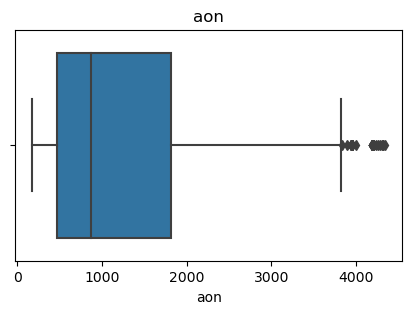

Data description: 
count    69999.000000
mean      1220.639709
std        952.426321
min        180.000000
25%        468.000000
50%        868.000000
75%       1813.000000
80%       2239.400000
90%       2792.000000
95%       3108.000000
97%       3289.060000
99%       3651.000000
max       4337.000000
Name: aon, dtype: float64


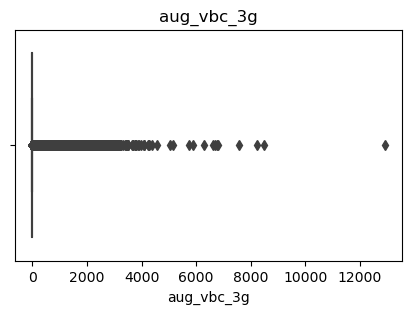

Data description: 
count    69999.000000
mean        68.108597
std        269.328659
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%        160.444000
95%        464.277000
97%        695.809600
99%       1226.659800
max      12916.220000
Name: aug_vbc_3g, dtype: float64


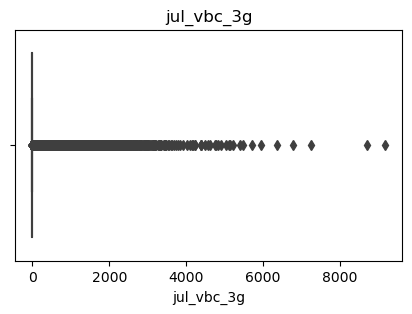

Data description: 
count    69999.000000
mean        65.935830
std        267.899034
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
80%          0.000000
90%        136.272000
95%        446.353000
97%        689.951400
99%       1254.279000
max       9165.600000
Name: jul_vbc_3g, dtype: float64


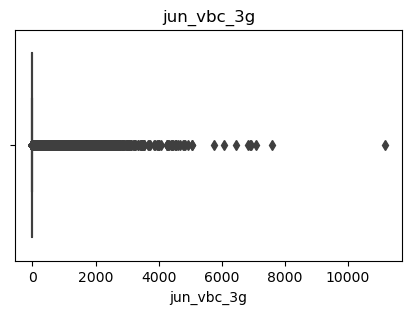

Data description: 
count    69999.00000
mean        60.07674
std        257.22681
min          0.00000
25%          0.00000
50%          0.00000
75%          0.00000
80%          0.00000
90%        110.32800
95%        400.13400
97%        623.35180
99%       1188.26780
max      11166.21000
Name: jun_vbc_3g, dtype: float64


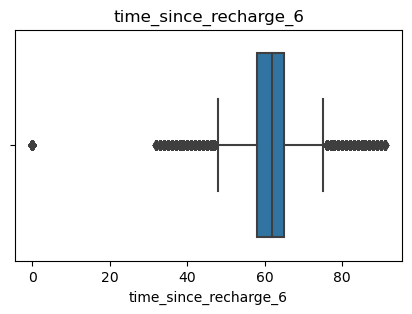

Data description: 
count    69999.000000
mean        59.154016
std         15.343519
min          0.000000
25%         58.000000
50%         62.000000
75%         65.000000
80%         67.000000
90%         72.000000
95%         75.000000
97%         77.000000
99%         81.000000
max         91.000000
Name: time_since_recharge_6, dtype: float64


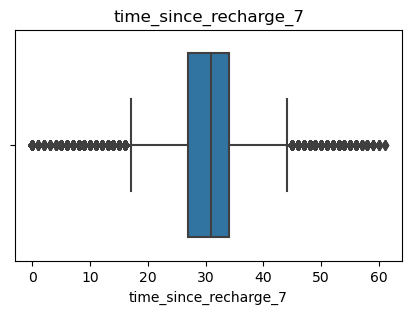

Data description: 
count    69999.000000
mean        29.434492
std          9.543427
min          0.000000
25%         27.000000
50%         31.000000
75%         34.000000
80%         35.000000
90%         39.000000
95%         43.000000
97%         45.000000
99%         50.000000
max         61.000000
Name: time_since_recharge_7, dtype: float64


In [37]:
for i in numerical_columns:
    data = train_data[i]
    plt.figure(figsize=(5, 3))
    sns.boxplot(data)
    plt.title(str(i))
    plt.show()
    print("Data description: ")
    print(train_data[i].describe([0.25,0.50,0.75,0.80,0.90,0.95,0.97,0.99]))

##### Observations:
1. We can see majority of numerical features have outliers
2. Dropping the rows which have the outlier value will impact our solution
3. We will treat the outliers by reassigning the fixed lower range and upper range values to feature values that are outside both the upper and lower IQR
4. One more point to note that we won't do anything for 'churn_probability' column as it is our target variable

In [38]:
for feature in outlier_df.Features.values:
    inter_quartile_range = train_data[feature].quantile(.99) - train_data[feature].quantile(.25)
    upper_range_value = train_data[feature].quantile(.99) + (1.5*inter_quartile_range)
    lower_range_value = train_data[feature].quantile(.25) - (1.5*inter_quartile_range)
    train_data[feature][train_data[feature] > upper_range_value] = upper_range_value
    train_data[feature][train_data[feature] < lower_range_value] = lower_range_value

In [39]:
train_data.describe()

# Observation: After reassigning the values there are lot of features that now contain constant value means they have no variation
# and that's why we can drop those features as they won't be able to contribute towards the model.

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,time_since_recharge_6,time_since_recharge_7
count,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.00000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000
mean,281.781147,276.766404,277.279051,132.550669,133.029949,132.083961,198.489769,196.613831,195.740759,9.059824,5.903343,6.036755,13.377729,9.040248,8.765082,44.766477,43.745731,43.421897,92.759776,90.511412,90.837330,3.631370,3.662042,3.560152,1.055718,1.259555,1.348137,143.124871,139.953043,139.616785,79.975207,82.970409,82.702827,87.568980,90.823106,89.583579,0.989170,0.927627,0.911097,169.541391,175.877675,174.464540,0.253229,0.249134,0.219358,3.763327,4.665381,4.807074,0.419046,0.001141,0.0

In [40]:
train_data.shape

(69999, 127)

#### Observation:
1. We found that majority of numerical columns had outliers
2. We decided to not drop those outliers but to treat them by reassigning the fixed lower range and upper range values
3. Now we are left with 127 columns and we can start with deriving new features

# Feature Engineering

Previously we have already derived 2 new features named time_since_recharge_6 an time_since_recharge_8

#### Deriving New Features

In [41]:
# Total mou at good phase incoming and outgoing
train_data['total_mou_good'] = (train_data['total_og_mou_6'] + train_data['total_ic_mou_6'])

In [42]:
# Avg. mou at action phase. We are taking average because there are two months(7 and 8) in action phase
train_data['avg_mou_action'] = (train_data['total_og_mou_7'] + train_data['total_og_mou_8'] + train_data['total_ic_mou_7'] + train_data['total_ic_mou_8'])/2


In [43]:
# Difference avg_mou_good and avg_mou_action
train_data['diff_mou'] = train_data['avg_mou_action'] - train_data['total_mou_good']

In [44]:
# Storing whether the mou has decreased in action phase
train_data['decrease_mou_action'] = np.where((train_data['diff_mou'] < 0), 1, 0)
train_data.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,time_since_recharge_6,time_since_recharge_7,total_mou_good,avg_mou_action,diff_mou,decrease_mou_action
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77.0,65,10.0,65,65,10,65,65,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0,0,0,1958,0.0,0.0,0.0,0,63.0,45.0,93.05,159.455,66.405,0
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0.0,145,50.0,0,145,50,0,0,0.0,0.0,352.91,0.00,0.0,3.96,0.0,0.0,0.0,0.0,0,0.0,0,0,1,0,0,0,0,710,0.0,0.0,0.0,0,75.0,47.0,3.44,63.435,59.995,0
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70.0,120,0.0,70,70,0,70,50,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0,0,0,882,0.0,0.0,0.0,0,74.0,33.0,180.78,84.915,-95.865,1
3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,0.00,0.00,0.00,0.00,8.03,44.91,48.84,23.63,0.26,12.06,0.00,15.33,25.93,4.6,0.56,0.0,0.0,16.16,37.99,4.60,0.0,0.0,0.0,14.95,9.13,25.61,0.00,0.0,

Observation: 
Derived new column decrease_mou_action

- This column indicates whether the minutes of usage of the customer has decreased in the action phase than the good phase.



In [45]:
# Avg rech number at action phase
train_data['avg_rech_num_action'] = (train_data['total_rech_num_7'] + train_data['total_rech_num_8'])/2


In [46]:
# Difference total_rech_num_6 and avg_rech_action
train_data['diff_rech_num'] = train_data['avg_rech_num_action'] - train_data['total_rech_num_6']


In [47]:
# Storing if rech_num has decreased in action phase
train_data['decrease_rech_num_action'] = np.where((train_data['diff_rech_num'] < 0), 1, 0)
train_data.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,time_since_recharge_6,time_since_recharge_7,total_mou_good,avg_mou_action,diff_mou,decrease_mou_action,avg_rech_num_action,diff_rech_num,decrease_rech_num_action
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77.0,65,10.0,65,65,10,65,65,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0,0,0,1958,0.0,0.0,0.0,0,63.0,45.0,93.05,159.455,66.405,0,2.0,-1.0,1
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0.0,145,50.0,0,145,50,0,0,0.0,0.0,352.91,0.00,0.0,3.96,0.0,0.0,0.0,0.0,0,0.0,0,0,1,0,0,0,0,710,0.0,0.0,0.0,0,75.0,47.0,3.44,63.435,59.995,0,4.5,1.5,0
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70.0,120,0.0,70,70,0,70,50,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0,0,0,882,0.0,0.0,0.0,0,74.0,33.0,180.78,84.915,-95.865,1,3.0,1.0,0
3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.00,0.0,0.0,0.00,0.0,1.63,6.99,3.94,0.00,37.91,44.89,23.63,0.00,0.00,0.00,0.00,0.00,8.03,44.91,48.84,23.63,0.26,12.06

Observation: Derived new columns decrease_rech_num_action
- This column indicates whether the number of recharge of the customer has decreased in the action phase than the good phase.

In [48]:
# Avg rech_amt in action phase
train_data['avg_rech_amt_action'] = (train_data['total_rech_amt_7'] + train_data['total_rech_amt_8'])/2

In [49]:
# Difference of action phase rech amt and good phase rech amt
train_data['diff_rech_amt'] = train_data['avg_rech_amt_action'] - train_data['total_rech_amt_6']

In [50]:
# Storing if rech_amt has decreased in action phase
train_data['decrease_rech_amt_action'] = np.where((train_data['diff_rech_amt'] < 0), 1, 0) 
train_data.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,time_since_recharge_6,time_since_recharge_7,total_mou_good,avg_mou_action,diff_mou,decrease_mou_action,avg_rech_num_action,diff_rech_num,decrease_rech_num_action,avg_rech_amt_action,diff_rech_amt,decrease_rech_amt_action
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77.0,65,10.0,65,65,10,65,65,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0,0,0,1958,0.0,0.0,0.0,0,63.0,45.0,93.05,159.455,66.405,0,2.0,-1.0,1,37.5,-39.5,1
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0.0,145,50.0,0,145,50,0,0,0.0,0.0,352.91,0.00,0.0,3.96,0.0,0.0,0.0,0.0,0,0.0,0,0,1,0,0,0,0,710,0.0,0.0,0.0,0,75.0,47.0,3.44,63.435,59.995,0,4.5,1.5,0,97.5,97.5,0
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70.0,120,0.0,70,70,0,70,50,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0,0,0,882,0.0,0.0,0.0,0,74.0,33.0,180.78,84.915,-95.865,1,3.0,1.0,0,60.0,-10.0,1
3,156.362,205.260,111.095,7.26,16.01,0.00,68.76,78.48,50.23,0.00,0.0,0.0,0.00,0.0

Observation: Derived new columns decrease_rech_amt_action
- This column indicates whether the amount of recharge of the customer has decreased in the action phase than the good phase.

In [51]:
# ARUP in action phase
train_data['avg_arpu_action'] = (train_data['arpu_7'] + train_data['arpu_8'])/2

In [52]:
# Difference of good and action phase ARPU
train_data['diff_arpu'] = train_data['avg_arpu_action'] - train_data['arpu_6']

In [53]:
# Storing whether the arpu has decreased on the action month
train_data['decrease_arpu_action'] = np.where(train_data['diff_arpu'] < 0, 1, 0)
train_data.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,time_since_recharge_6,time_since_recharge_7,total_mou_good,avg_mou_action,diff_mou,decrease_mou_action,avg_rech_num_action,diff_rech_num,decrease_rech_num_action,avg_rech_amt_action,diff_rech_amt,decrease_rech_amt_action,avg_arpu_action,diff_arpu,decrease_arpu_action
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77.0,65,10.0,65,65,10,65,65,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0,0,0,1958,0.0,0.0,0.0,0,63.0,45.0,93.05,159.455,66.405,0,2.0,-1.0,1,37.5,-39.5,1,47.2680,15.9910,0
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0.0,145,50.0,0,145,50,0,0,0.0,0.0,352.91,0.00,0.0,3.96,0.0,0.0,0.0,0.0,0,0.0,0,0,1,0,0,0,0,710,0.0,0.0,0.0,0,75.0,47.0,3.44,63.435,59.995,0,4.5,1.5,0,97.5,97.5,0,82.8700,82.8700,0
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70.0,120,0.0,70,70,0,70,50,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0,0,0,882,0.0,0.0,0.0,0,74.0,33.0,180.78,84.915,-95.865,1,3.0,1.0,0,60.0,-10.0,

Observation: Derived new columns decrease_arpu_action
- This column indicates whether the average revenue per customer has decreased in the action phase than the good phase.

In [54]:
# VBC in action phase
train_data['avg_vbc_3g_action'] = (train_data['jul_vbc_3g'] + train_data['aug_vbc_3g'])/2

In [55]:
# Difference of good and action phase VBC
train_data['diff_vbc'] = train_data['avg_vbc_3g_action'] - train_data['jun_vbc_3g']

In [56]:
# Checking whether the VBC has decreased on the action month
train_data['decrease_vbc_action'] = np.where(train_data['diff_vbc'] < 0 , 1, 0)
train_data.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,time_since_recharge_6,time_since_recharge_7,total_mou_good,avg_mou_action,diff_mou,decrease_mou_action,avg_rech_num_action,diff_rech_num,decrease_rech_num_action,avg_rech_amt_action,diff_rech_amt,decrease_rech_amt_action,avg_arpu_action,diff_arpu,decrease_arpu_action,avg_vbc_3g_action,diff_vbc,decrease_vbc_action
0,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77.0,65,10.0,65,65,10,65,65,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0,0,0,1958,0.0,0.0,0.0,0,63.0,45.0,93.05,159.455,66.405,0,2.0,-1.0,1,37.5,-39.5,1,47.2680,15.9910,0,0.0,0.0,0
1,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0.0,145,50.0,0,145,50,0,0,0.0,0.0,352.91,0.00,0.0,3.96,0.0,0.0,0.0,0.0,0,0.0,0,0,1,0,0,0,0,710,0.0,0.0,0.0,0,75.0,47.0,3.44,63.435,59.995,0,4.5,1.5,0,97.5,97.5,0,82.8700,82.8700,0,0.0,0.0,0
2,60.806,103.176,0.000,0.53,15.93,0.00,53.99,82.05,0.00,0.00,0.0,0.0,0.00,0.0,0.00,0.53,12.98,0.00,24.11,0.00,0.00,0.00,0.00,0.00,2.14,0.00,0.00,24.64,12.98,0.00,0.00,2.94,0.00,28.94,82.05,0.0,0.00,0.0,0.0,28.94,84.99,0.00,0.0,0.0,0.0,2.89,1.38,0.00,0.00,0.0,0.0,56.49,99.36,0.00,4.51,6.16,6.49,89.86,25.18,23.51,0.00,0.00,0.00,94.38,31.34,30.01,11.69,0.00,0.00,18.21,2.48,6.38,0.0,0.0,0.0,29.91,2.48,6.38,124.29,33.83,36.64,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.00,0.25,2,4,2,70.0,120,0.0,70,70,0,70,50,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0,0.0,0,0,0,0,0,0,0,882,0.

Observation: Deriving new column decrease_vbc_action
- This column indicates whether the volume based cost of the customer has decreased in the action phase than the good phase.

# Exploratory Data Analysis

### Univariate Analysis

Churn rate on the basis whether the customer decreased her/his MOU in action month

In [57]:
# Converting churn column to int in order to do aggfunc in the pivot table
train_data['churn_probability'] = train_data['churn_probability'].astype('int64')


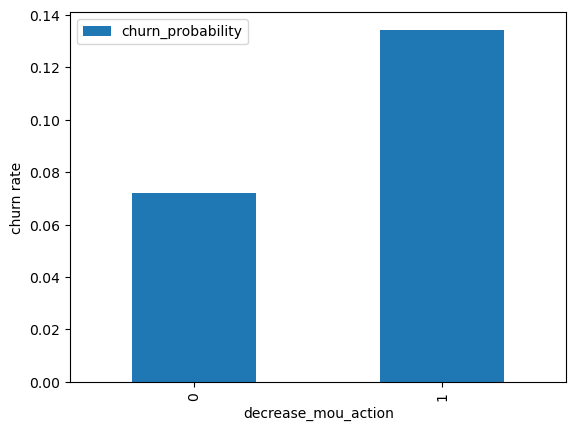

In [58]:
train_data.pivot_table(values='churn_probability', index='decrease_mou_action', aggfunc='mean').plot.bar()
plt.ylabel('churn rate')
plt.show()

Observation: 
-  We can see that the churn rate is more for the customers, whose mou decreased in the action phase compare to the good phase.

Churn rate on the basis whether the customer decreased her/his number of recharge in action month

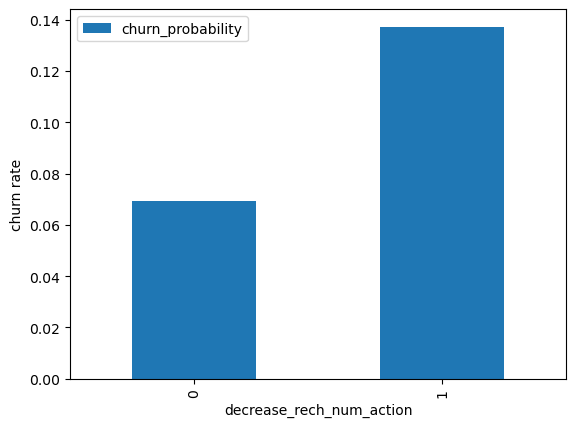

In [59]:
train_data.pivot_table(values='churn_probability', index='decrease_rech_num_action', aggfunc='mean').plot.bar()
plt.ylabel('churn rate')
plt.show()

Observation:
- As expected, the churn rate is more for the customers, whose number of recharge in the action phase is lesser than the number in good phase.

Churn rate on the basis whether the customer decreased her/his amount of recharge in action month

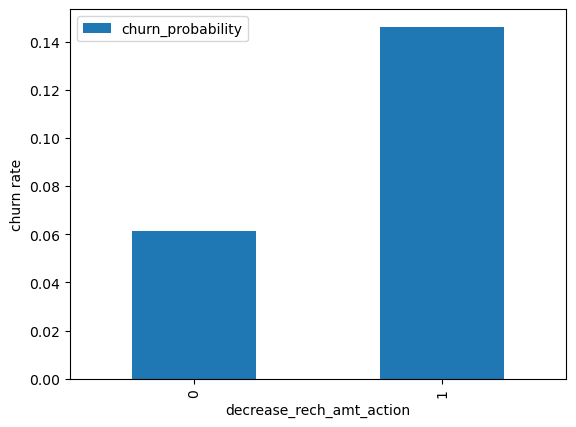

In [60]:
train_data.pivot_table(values='churn_probability', index='decrease_rech_amt_action', aggfunc='mean').plot.bar()
plt.ylabel('churn rate')
plt.show()

Observation
- Again we can check that the churn rate is more for the customers, whose amount of recharge in the action phase is lesser than the amount in good phase.

Churn rate on the basis whether the customer decreased her/his volume based cost in action month

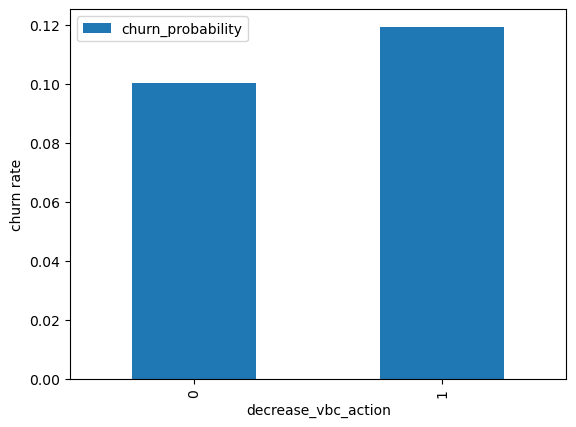

In [61]:
train_data.pivot_table(values='churn_probability', index='decrease_vbc_action', aggfunc='mean').plot.bar()
plt.ylabel('churn rate')
plt.show()

Observation:
- Here we see the expected result. The churn rate is more for the customers, whose volume based cost in action month is increased. That means the customers do not do the monthly recharge more when they are in the action phase.

Analysis of the average revenue per customer (churn and not churn) in the action phase


In [62]:
# Creating churn dataframe
data_churn = train_data[train_data['churn_probability'] == 1]
# Creating not churn dataframe
data_non_churn = train_data[train_data['churn_probability'] == 0]

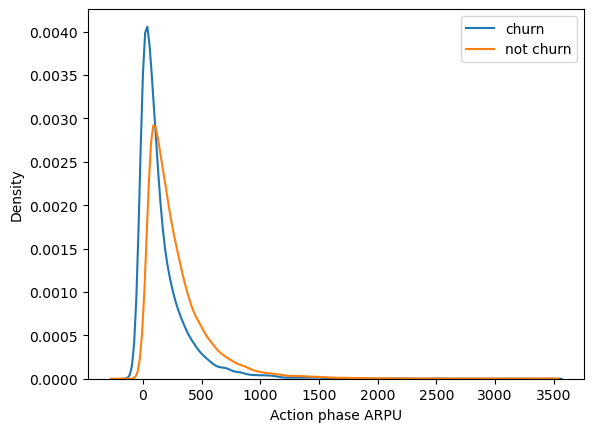

In [63]:
# Distribution plot
ax = sns.distplot(data_churn['avg_arpu_action'],label='churn',hist=False)
ax = sns.distplot(data_non_churn['avg_arpu_action'],label='not churn',hist=False)
ax.set(xlabel='Action phase ARPU')
plt.legend()

Observation:
- Average revenue per user (ARPU) for the churned customers is mostly densed on the 0 to 700. The higher ARPU customers are less likely to be churned.
- ARPU for the not churned customers is mostly densed on the 0 to 800.

Analysis of the minutes of usage MOU (churn and not churn) in the action phase

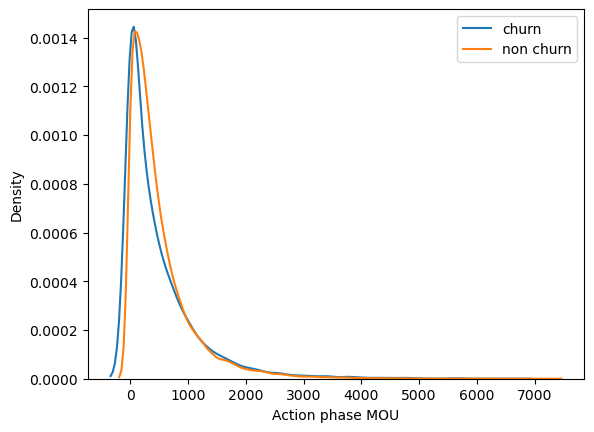

In [64]:
# Distribution plot
ax = sns.distplot(data_churn['total_mou_good'],label='churn',hist=False)
ax = sns.distplot(data_non_churn['total_mou_good'],label='non churn',hist=False)
ax.set(xlabel='Action phase MOU')
plt.legend()

Observation:
- Minutes of usage(MOU) of the churn customers is mostly populated on the 0 to 1000 range. Higher the MOU, lesser the churn probability.

### Bivariate Analysis

Analysis of churn rate by the decreasing recharge amount and number of recharge in the action phase

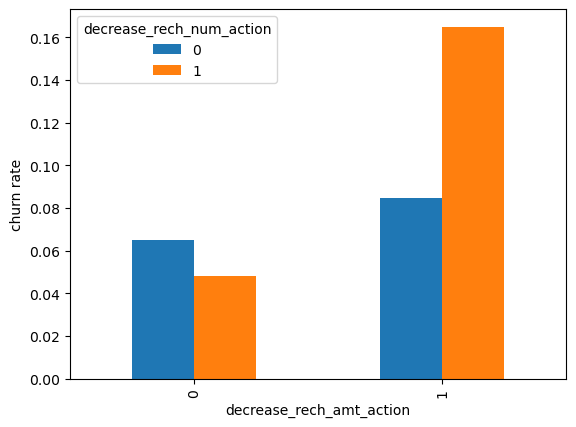

In [65]:
train_data.pivot_table(values='churn_probability', index='decrease_rech_amt_action', columns='decrease_rech_num_action', aggfunc='mean').plot.bar()
plt.ylabel('churn rate')
plt.show()

**Observation**

We can see from the above plot, that the churn rate is more for the customers, whose recharge amount as well as number of recharge have decreased in the action phase than the good phase.

Analysis of churn rate by the decreasing recharge amount and volume based cost in the action phase

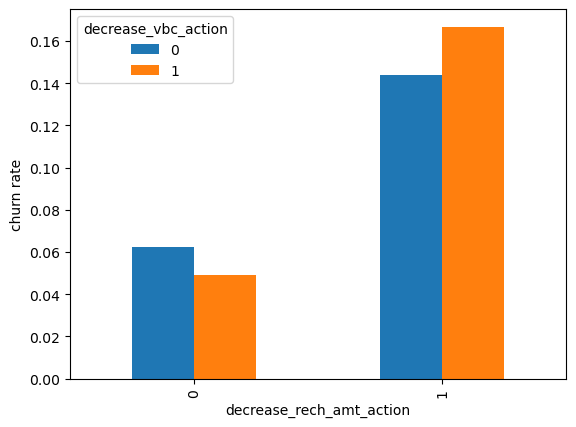

In [66]:
train_data.pivot_table(values='churn_probability', index='decrease_rech_amt_action', columns='decrease_vbc_action', aggfunc='mean').plot.bar()
plt.ylabel('churn rate')
plt.show()

Observation:
- In this case too, we can see that the churn rate is more for the customers, whose recharge amount is decreased along with the volume based cost is increased in the action month.

Analysis of recharge amount and number of recharge in action month

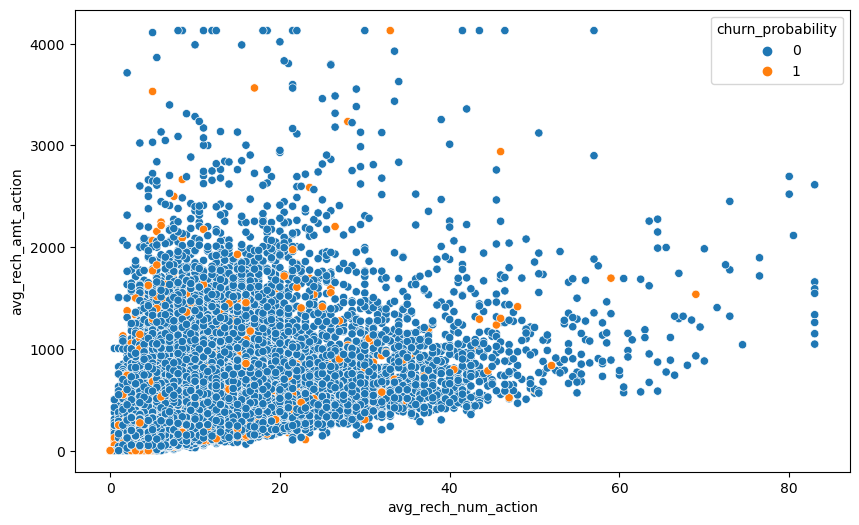

In [67]:
plt.figure(figsize=(10,6))
ax = sns.scatterplot(x='avg_rech_num_action',y='avg_rech_amt_action', hue='churn_probability', data=train_data)

Observation:
- We can see from the above pattern that the recharge number and the recharge amount are mostly propotional. More the number of recharge, more the amount of the recharge.

##### Checking the correlation matrix of the current data

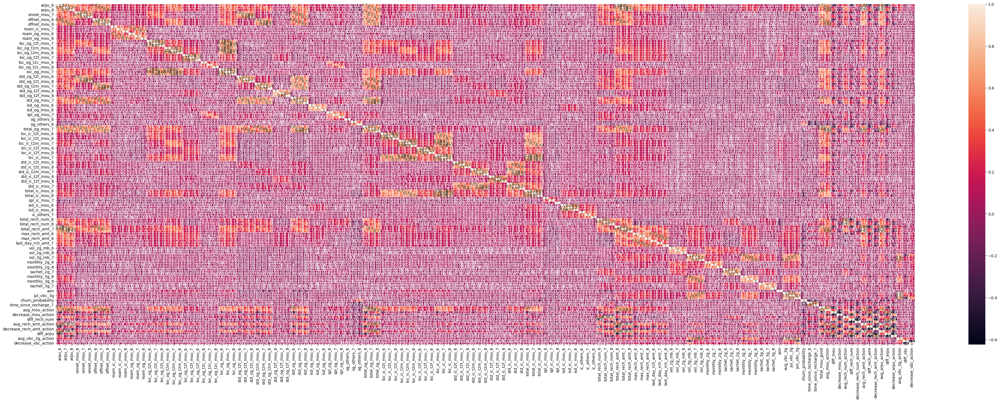

In [68]:
plt.figure(figsize=(50,16))
sns.heatmap(train_data.corr(), annot=True)
plt.show()

Observation: The matrix is very complex to understand because of number of columns, so now we will unstack them and form a list to understand the correlations

In [69]:
correlation_matrix = train_data.corr()

In [70]:
# Sort correlations by strength
sorted_correlations = correlation_matrix.unstack().sort_values(ascending=False)

# Print the top positively correlated pairs
print(sorted_correlations.head(200))

# Print the top negatively correlated pairs
print(sorted_correlations.tail(50))

arpu_6                    arpu_6                      1.000000
spl_og_mou_6              spl_og_mou_6                1.000000
total_og_mou_6            total_og_mou_6              1.000000
og_others_8               og_others_8                 1.000000
og_others_7               og_others_7                 1.000000
og_others_6               og_others_6                 1.000000
spl_og_mou_8              spl_og_mou_8                1.000000
spl_og_mou_7              spl_og_mou_7                1.000000
isd_og_mou_8              isd_og_mou_8                1.000000
total_og_mou_8            total_og_mou_8              1.000000
isd_og_mou_7              isd_og_mou_7                1.000000
isd_og_mou_6              isd_og_mou_6                1.000000
std_og_mou_8              std_og_mou_8                1.000000
std_og_mou_7              std_og_mou_7                1.000000
std_og_mou_6              std_og_mou_6                1.000000
std_og_t2f_mou_8          std_og_t2f_mou_8            1

In [71]:
# Filter correlations above a certain threshold
threshold = 0.3
high_correlations = correlation_matrix[abs(correlation_matrix) > threshold]
high_correlations.unstack().sort_values(ascending=False).head(800)

arpu_6                    arpu_6                      1.000000
og_others_6               og_others_6                 1.000000
loc_ic_t2t_mou_6          loc_ic_t2t_mou_6            1.000000
total_og_mou_8            total_og_mou_8              1.000000
total_og_mou_7            total_og_mou_7              1.000000
total_og_mou_6            total_og_mou_6              1.000000
og_others_8               og_others_8                 1.000000
og_others_7               og_others_7                 1.000000
spl_og_mou_8              spl_og_mou_8                1.000000
std_og_mou_6              std_og_mou_6                1.000000
spl_og_mou_7              spl_og_mou_7                1.000000
spl_og_mou_6              spl_og_mou_6                1.000000
isd_og_mou_8              isd_og_mou_8                1.000000
isd_og_mou_7              isd_og_mou_7                1.000000
isd_og_mou_6              isd_og_mou_6                1.000000
std_og_mou_8              std_og_mou_8                1

Observation: From the above results we can see that there are high collinearity in the data and to resolve this we will use Principal Component Analysis

### Dealing with Data imbalance

In [72]:
churn = train_data['churn_probability']
data = train_data.drop('churn_probability', axis=1)

In [73]:
X = data
y = churn

sm = SMOTE(random_state=27)
X, y = sm.fit_resample(X, y)


## Data Splitting

In [74]:
# Splitting data into train and test set 80:20
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=100)


#### Feature Scaling

In [75]:
scaler = StandardScaler()

In [76]:
numerical_columns = X_train.columns[(X_train.dtypes != 'object') | (X_train.dtypes != 'datetime64[ns]')].to_list()
print(numerical_columns)

['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'lo

In [363]:
len(numerical_columns)

81

In [77]:
X_train[numerical_columns] = scaler.fit_transform(X_train[numerical_columns])

In [78]:
# Transforming the test set
X_test[numerical_columns] = scaler.transform(X_test[numerical_columns])

## Model Building

In [79]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = roc_auc_score( actual, probs )
    plt.figure(figsize=(6, 6))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return fpr, tpr, thresholds

In [80]:
def evaluate_model_on_testset(actual, pred):
    # Accuracy Score
    acc_score = round(accuracy_score(actual, pred)*100,2)
    print('Accuracy Score : ',acc_score)
    # ROC AUC score
    roc_score = round(roc_auc_score(actual, pred)*100,2)
    print('ROC AUC score : ',roc_score)
    # Precision score
    prec_score = round(precision_score(actual, pred)*100,2)
    print('Precision score : ', prec_score)
    # Recall score
    rec_score = round(recall_score(actual, pred)*100,2)
    print('Recall score : ', rec_score)

    confusion = confusion_matrix(actual, pred)
    TP = confusion[1,1] # true positive 
    TN = confusion[0,0] # true negatives
    FP = confusion[0,1] # false positives
    FN = confusion[1,0] # false negatives

    sensitivity = TP / float(TP+FN)
    specificity = TN / float(TN+FP)

   # Sensitivity
    print("Sensitivity : ", round(sensitivity*100, 2))

    # Specificity
    print("Specificity : ", round(specificity*100, 2))

    print('Confusion Matrix : \n', confusion)

    return acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion

In [81]:
def evaluate_model_on_trainset(actual, pred):
    # Accuracy Score
    acc_score = round(accuracy_score(actual, pred)*100,2)
    print('Accuracy Score : ',acc_score)
    # ROC AUC score
    roc_score = round(roc_auc_score(actual, pred)*100,2)
    print('ROC AUC score : ',roc_score)
    # Precision score
    prec_score = round(precision_score(actual, pred)*100,2)
    print('Precision score : ', prec_score)
    # Recall score
    rec_score = round(recall_score(actual, pred)*100,2)
    print('Recall score : ', rec_score)

    confusion = confusion_matrix(actual, pred)
    TP = confusion[1,1] # true positive 
    TN = confusion[0,0] # true negatives
    FP = confusion[0,1] # false positives
    FN = confusion[1,0] # false negatives

    sensitivity = TP / float(TP+FN)
    specificity = TN / float(TN+FP)

    # Sensitivity
    print("Sensitivity : ", round(sensitivity*100, 2))

    # Specificity
    print("Specificity : ", round(specificity*100, 2))

    print('Confusion Matrix : \n', confusion)

    return acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion

### Logistic Regression without PCA

In [82]:
lm_model = LogisticRegression(class_weight="balanced", random_state=42)

In [83]:
# fit the pca training data
lm_model.fit(X_train, y_train)
# predict the testing pca data
Y_train_pred = lm_model.predict(X_train)
Y_pred = lm_model.predict(X_test)

# Model evaluation on training data
print('Model evaluation on Training data :')
acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion = evaluate_model_on_trainset(y_train, Y_train_pred)

print('-'*50)

# Model evaluation on test data
print('Model evaluation on Testing data :')
acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion = evaluate_model_on_testset(y_test, Y_pred)


Model evaluation on Training data :
Accuracy Score :  94.39
ROC AUC score :  94.39
Precision score :  97.12
Recall score :  91.48
Sensitivity :  91.48
Specificity :  97.29
Confusion Matrix : 
 [[48934  1362]
 [ 4284 46007]]
--------------------------------------------------
Model evaluation on Testing data :
Accuracy Score :  94.46
ROC AUC score :  94.47
Precision score :  97.17
Recall score :  91.6
Sensitivity :  91.6
Specificity :  97.33
Confusion Matrix : 
 [[12235   336]
 [ 1056 11520]]


### Applying PCA

In [84]:
pca = PCA(random_state=42)

In [85]:
pca.fit(X_train)

PCA(random_state=42)

In [86]:
pca.components_

array([[ 1.46452415e-01,  1.83537132e-01,  1.75260905e-01, ...,
         5.66826261e-02,  1.05968708e-02,  2.10926912e-02],
       [ 8.96502818e-02,  5.83778078e-02,  1.32788435e-03, ...,
        -9.24510994e-02, -1.10839600e-02, -5.30305128e-02],
       [-1.46766362e-01,  5.74332450e-02,  1.31478544e-01, ...,
         4.94266160e-02,  5.38857903e-02, -1.75444233e-02],
       ...,
       [ 0.00000000e+00,  2.50933410e-01,  2.39044662e-01, ...,
        -3.25855418e-02,  2.68650498e-02, -3.29597460e-17],
       [-0.00000000e+00, -7.14970900e-02, -6.81096936e-02, ...,
         5.64336144e-02, -3.99109480e-03, -1.30104261e-17],
       [-0.00000000e+00,  4.64988456e-02,  4.42958186e-02, ...,
         2.19167147e-02,  3.34301408e-03, -5.03069808e-17]])

In [87]:
pca.explained_variance_ratio_

array([1.37921033e-01, 7.08867781e-02, 6.72707628e-02, 4.83876464e-02,
       3.81696647e-02, 3.32412780e-02, 2.69055433e-02, 2.57482644e-02,
       2.25985829e-02, 2.15065256e-02, 2.05612249e-02, 1.97378256e-02,
       1.82110560e-02, 1.72659606e-02, 1.60191520e-02, 1.52379824e-02,
       1.46751096e-02, 1.41955410e-02, 1.37000848e-02, 1.18521989e-02,
       1.15155780e-02, 1.11572282e-02, 1.08139472e-02, 1.01269400e-02,
       1.00931485e-02, 9.75930650e-03, 9.22136224e-03, 8.94568240e-03,
       8.60063279e-03, 8.18707552e-03, 7.97776026e-03, 7.52476645e-03,
       7.24721686e-03, 7.00558945e-03, 6.87455866e-03, 6.48387402e-03,
       6.43572734e-03, 6.34492680e-03, 6.14411274e-03, 5.95009259e-03,
       5.83962649e-03, 5.56008545e-03, 5.46070185e-03, 5.14914151e-03,
       5.05389000e-03, 4.82046895e-03, 4.74754232e-03, 4.57867049e-03,
       4.36769207e-03, 4.31647251e-03, 4.13778109e-03, 4.07263874e-03,
       4.05025487e-03, 3.91813380e-03, 3.83635354e-03, 3.78688381e-03,
      

Making a scree plot for the explained variance

In [88]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)

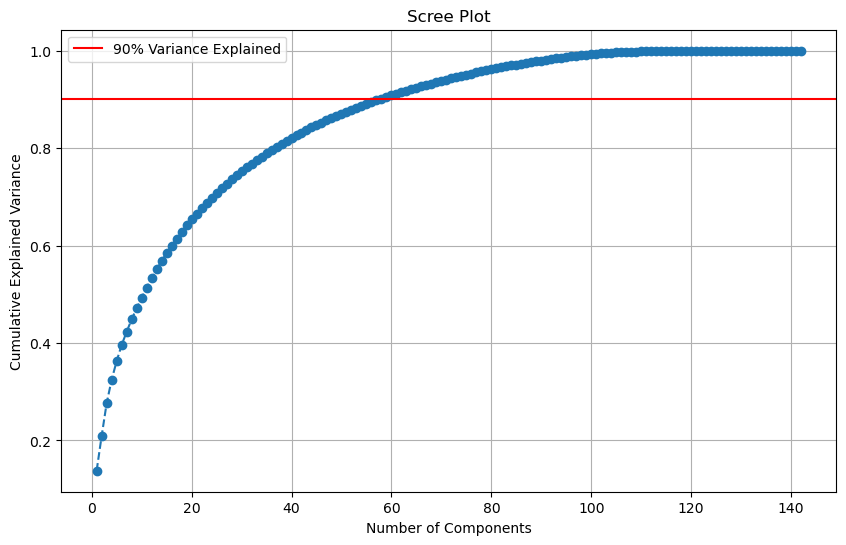

In [89]:
# Create a scree plot
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(var_cumu) + 1), var_cumu, marker='o', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Plot')
plt.grid(True)

# You can also add a horizontal line to indicate a desired threshold, e.g., 0.90 for 90% variance
plt.axhline(y=0.90, color='r', linestyle='-', label='90% Variance Explained')
plt.legend()

plt.show()

Performing PCA with 60 features

In [90]:
pca_final = IncrementalPCA(n_components=60)

In [91]:
X_train_pca = pca_final.fit_transform(X_train)

In [92]:
X_train_pca.shape

(100587, 60)

In [93]:
corrmat = np.corrcoef(X_train_pca.transpose())

In [94]:
corrmat.shape

(60, 60)

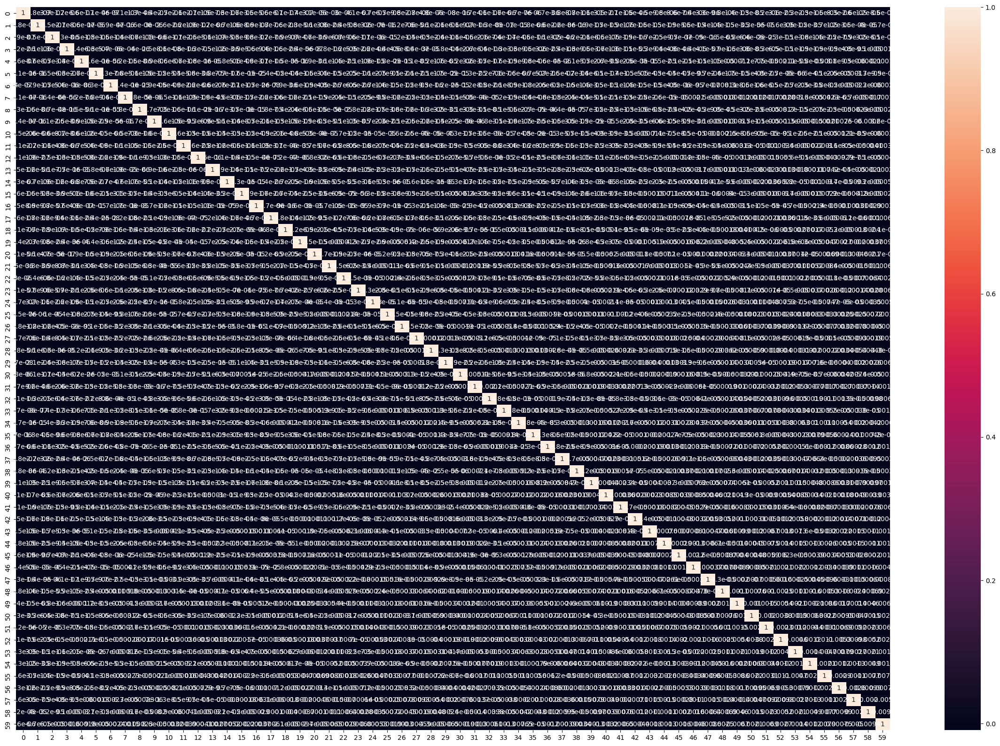

In [95]:
plt.figure(figsize=[30,20])
sns.heatmap(corrmat, annot=True)
plt.show()

In [96]:
X_test_pca = pca_final.transform(X_test)
X_test_pca.shape

(25147, 60)

### Applying Logistic Regression with PCA

In [97]:
lm_pca = LogisticRegression()

In [98]:
lm_model_pca = lm_pca.fit(X_train_pca, y_train)
Y_train_pca_pred = lm_model_pca.predict(X_train_pca)
Y_test_pca_pred  = lm_model_pca.predict(X_test_pca)


# Model evaluation on training data
print('Model evaluation on Training data :')
acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion = evaluate_model_on_trainset(y_train, Y_train_pca_pred)

print('-'*50)

# Model evaluation on test data
print('Model evaluation on Testing data :')
acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion = evaluate_model_on_testset(y_test, Y_test_pca_pred)

Model evaluation on Training data :
Accuracy Score :  84.85
ROC AUC score :  84.85
Precision score :  84.62
Recall score :  85.18
Sensitivity :  85.18
Specificity :  84.52
Confusion Matrix : 
 [[42512  7784]
 [ 7453 42838]]
--------------------------------------------------
Model evaluation on Testing data :
Accuracy Score :  85.12
ROC AUC score :  85.12
Precision score :  84.89
Recall score :  85.45
Sensitivity :  85.45
Specificity :  84.78
Confusion Matrix : 
 [[10658  1913]
 [ 1830 10746]]


### Ridge Classifier Model

In [99]:
# initialize the Ridge Classifier
ridge_model = RidgeClassifier(class_weight='balanced', random_state=42)
# fit the pca training data
ridge_model.fit(X_train_pca, y_train)
# predict the pca testing data
Y_ridge_pred_train = ridge_model.predict(X_train_pca)
Y_ridge_pred_test = ridge_model.predict(X_test_pca)


# Model evaluation on training data
print('Model evaluation on Training data :')
acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion = evaluate_model_on_trainset(y_train, Y_ridge_pred_train)

print('-'*50)

# Model evaluation on test data
print('Model evaluation on Testing data :')
acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion = evaluate_model_on_testset(y_test, Y_ridge_pred_test)

Model evaluation on Training data :
Accuracy Score :  84.53
ROC AUC score :  84.53
Precision score :  85.58
Recall score :  83.05
Sensitivity :  83.05
Specificity :  86.01
Confusion Matrix : 
 [[43258  7038]
 [ 8524 41767]]
--------------------------------------------------
Model evaluation on Testing data :
Accuracy Score :  84.7
ROC AUC score :  84.7
Precision score :  85.67
Recall score :  83.34
Sensitivity :  83.34
Specificity :  86.06
Confusion Matrix : 
 [[10818  1753]
 [ 2095 10481]]


#### Decision Tree Model without GCV

In [100]:
# initialize the Decision Tree
dt_model = DecisionTreeClassifier(class_weight='balanced', random_state=42, max_depth=10, min_samples_leaf=60)
# fit the pca training data
dt_model.fit(X_train_pca, y_train)
# predict the pca testing data
Y_dt_pred_train = dt_model.predict(X_train_pca)
Y_dt_pred_test = dt_model.predict(X_test_pca)


# Model evaluation on training data
print('Model evaluation on Training data :')
acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion = evaluate_model_on_trainset(y_train, Y_dt_pred_train)

print('-'*50)

# Model evaluation on test data
print('Model evaluation on Testing data :')
acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion = evaluate_model_on_testset(y_test, Y_dt_pred_test)

Model evaluation on Training data :
Accuracy Score :  84.53
ROC AUC score :  84.53
Precision score :  84.36
Recall score :  84.76
Sensitivity :  84.76
Specificity :  84.29
Confusion Matrix : 
 [[42394  7902]
 [ 7663 42628]]
--------------------------------------------------
Model evaluation on Testing data :
Accuracy Score :  82.82
ROC AUC score :  82.82
Precision score :  82.56
Recall score :  83.25
Sensitivity :  83.25
Specificity :  82.4
Confusion Matrix : 
 [[10359  2212]
 [ 2107 10469]]


#### Decision Tree with GCV

In [101]:
def perform_grid_cross_validation(split_count, estimator, hyper_params, scoring_scheme, X, y, random_state=100):
    # step-1: create a cross-validation scheme

    folds = KFold(n_splits = split_count, shuffle = True, random_state = random_state)    


    model_cv = GridSearchCV(estimator = estimator, 
                            param_grid = hyper_params, 
                            scoring= scoring_scheme, 
                            cv = folds, 
                            verbose = 1,
                            n_jobs=-1,
                            return_train_score=True)      

    # fit the model
    model_cv.fit(X, y)
    return model_cv

In [102]:
dt_with_gcv = DecisionTreeClassifier(random_state=42)

In [103]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': range(5, 20, 5),
    'min_samples_leaf': range(15, 150, 20),
    'min_samples_split': range(15, 150, 20)

}
dt_cross_validation_model = perform_grid_cross_validation(split_count=5,
                                                       estimator=dt_with_gcv,
                                                       hyper_params=params,
                                                       scoring_scheme="accuracy",
                                                       X=X_train_pca,
                                                       y=y_train)

Fitting 5 folds for each of 147 candidates, totalling 735 fits


In [104]:
scoring_df = pd.DataFrame(dt_cross_validation_model.cv_results_)
scoring_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,3.892836,0.051490,0.009989,0.004243,5,15,15,"{'max_depth': 5, 'min_samples_leaf': 15, 'min_...",0.788249,0.790784,0.786598,0.784709,0.790923,0.788253,0.002401,127,0.793573,0.790876,0.792979,0.788928,0.79396,0.792063,0.001895
1,3.793258,0.104138,0.009983,0.005690,5,15,35,"{'max_depth': 5, 'min_samples_leaf': 15, 'min_...",0.788249,0.790784,0.786598,0.784709,0.790923,0.788253,0.002401,127,0.793573,0.790876,0.792979,0.788928,0.79396,0.792063,0.001895
2,3.625197,0.054830,0.007867,0.002204,5,15,55,"{'max_depth': 5, 'min_samples_leaf': 15, 'min_...",0.788249,0.790784,0.786598,0.784709,0.790923,0.788253,0.002401,127,0.793573,0.790876,0.792979,0.788928,0.79396,0.792063,0.001895
3,3.464927,0.074851,0.011492,0.007724,5,15,75,"{'max_depth': 5, 'min_samples_leaf': 15, 'min_...",0.788249,0.790784,0.786598,0.784709,0.790923,0.788253,0.002401,127,0.793573,0.790876,0.792979,0.788928,0.79396,0.792063,0.001895
4,3.451265,0.028275,0.008299,0.003626,5,15,95,"{'max_depth': 5, 'min_samples_leaf': 15, 'min_...",0.788249,0.790784,0.786598,0.784709,0.790923,0.788253,0.002401,127,0.793573,0.790876,0.792979,0.788928,0.79396,0.792063,0.001895


In [105]:
dt_cross_validation_model.best_estimator_

DecisionTreeClassifier(max_depth=15, min_samples_leaf=15, min_samples_split=15,
                       random_state=42)

In [106]:
scoring_df.nlargest(5,"mean_test_score")

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_leaf,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
98,8.637600,0.091210,0.010111,0.002258,15,15,15,"{'max_depth': 15, 'min_samples_leaf': 15, 'min...",0.842181,0.845611,0.843913,0.846498,0.841925,0.844026,0.001814,1,0.904833,0.902335,0.901665,0.903778,0.902635,0.903049,0.001123
99,8.761852,0.021969,0.010958,0.000719,15,15,35,"{'max_depth': 15, 'min_samples_leaf': 15, 'min...",0.839994,0.844816,0.844062,0.846548,0.839439,0.842972,0.002783,2,0.900956,0.899067,0.898770,0.901678,0.898124,0.899719,0.001359
100,8.592535,0.105909,0.007913,0.001862,15,15,55,"{'max_depth': 15, 'min_samples_leaf': 15, 'min...",0.838503,0.842430,0.840980,0.840533,0.839390,0.840367,0.001348,3,0.890206,0.889100,0.889151,0.890493,0.888319,0.889454,0.000794
101,8.541259,0.064504,0.008810,0.002845,15,15,75,"{'max_depth': 15, 'min_samples_leaf': 15, 'min...",0.839696,0.840243,0.837948,0.839240,0.835860,0.838597,0.001565,4,0.880277,0.880103,0.882416,0.882490,0.880514,0.881160,0.001064
105,8.241115,0.074539,0.008304,0.001292,15,35,15,"{'max_depth': 15, 'min_samples_leaf': 35, 'min...",0.840789,0.838105,0.834965,0.837351,0.836755,0.837593,0.001905,5,0.873541,0.874548,0.875743,0.875071,0.875656,0.874912,0.000810


In [107]:
# filtering best model from the cross validation
decision_tree_best_model = dt_cross_validation_model.best_estimator_


In [108]:
Y_dt_pred_train = decision_tree_best_model.predict(X_train_pca)
Y_dt_pred_test = decision_tree_best_model.predict(X_test_pca)


# Model evaluation on training data
print('Model evaluation on Training data :')
acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion = evaluate_model_on_trainset(y_train, Y_dt_pred_train)

print('-'*50)

# Model evaluation on test data
print('Model evaluation on Testing data :')
acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion = evaluate_model_on_testset(y_test, Y_dt_pred_test)

Model evaluation on Training data :
Accuracy Score :  90.6
ROC AUC score :  90.6
Precision score :  89.9
Recall score :  91.48
Sensitivity :  91.48
Specificity :  89.72
Confusion Matrix : 
 [[45126  5170]
 [ 4286 46005]]
--------------------------------------------------
Model evaluation on Testing data :
Accuracy Score :  85.33
ROC AUC score :  85.33
Precision score :  84.21
Recall score :  86.97
Sensitivity :  86.97
Specificity :  83.68
Confusion Matrix : 
 [[10520  2051]
 [ 1639 10937]]


#### Random Forest without GCV

In [109]:
randomForestClassifier = RandomForestClassifier(class_weight='balanced', random_state=42, max_depth=10, n_estimators=70, min_samples_leaf=60, oob_score=True)

In [110]:
randomForestClassifier.fit(X_train_pca, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=10,
                       min_samples_leaf=60, n_estimators=70, oob_score=True,
                       random_state=42)

In [111]:
randomForestClassifier.estimators_[3]

DecisionTreeClassifier(max_depth=10, max_features='sqrt', min_samples_leaf=60,
                       random_state=787846414)

In [112]:
Y_dt_pred_train = randomForestClassifier.predict(X_train_pca)
Y_dt_pred_test = randomForestClassifier.predict(X_test_pca)


# Model evaluation on training data
print('Model evaluation on Training data :')
acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion = evaluate_model_on_trainset(y_train, Y_dt_pred_train)

print('-'*50)

# Model evaluation on test data
print('Model evaluation on Testing data :')
acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion = evaluate_model_on_testset(y_test, Y_dt_pred_test)

Model evaluation on Training data :
Accuracy Score :  87.03
ROC AUC score :  87.03
Precision score :  88.45
Recall score :  85.18
Sensitivity :  85.18
Specificity :  88.88
Confusion Matrix : 
 [[44704  5592]
 [ 7453 42838]]
--------------------------------------------------
Model evaluation on Testing data :
Accuracy Score :  86.09
ROC AUC score :  86.09
Precision score :  87.71
Recall score :  83.94
Sensitivity :  83.94
Specificity :  88.23
Confusion Matrix : 
 [[11092  1479]
 [ 2020 10556]]


#### Random Forest with GCV

In [113]:
def tune_hyperparameter(parameters,x_train,y_train,n_folds = 5,max_depth=0):
    
    if(max_depth==0):
        rf = RandomForestClassifier()
    else :
        rf = RandomForestClassifier(max_depth=max_depth)
        
    rf = GridSearchCV(rf, parameters, cv=n_folds,n_jobs = -1, scoring="accuracy",return_train_score=True)
    rf.fit(x_train, y_train)
    scores = rf.cv_results_

    for key in parameters.keys():
        hyperparameters = key
        break

    # plotting accuracies for parameters
    plt.figure(figsize=(16,5))
    plt.plot(scores["param_"+hyperparameters], scores["mean_train_score"], label="training accuracy")
    plt.plot(scores["param_"+hyperparameters], scores["mean_test_score"], label="test accuracy")
    plt.xlabel(hyperparameters)
    plt.ylabel("Accuracy")
    plt.legend()
    plt.show()

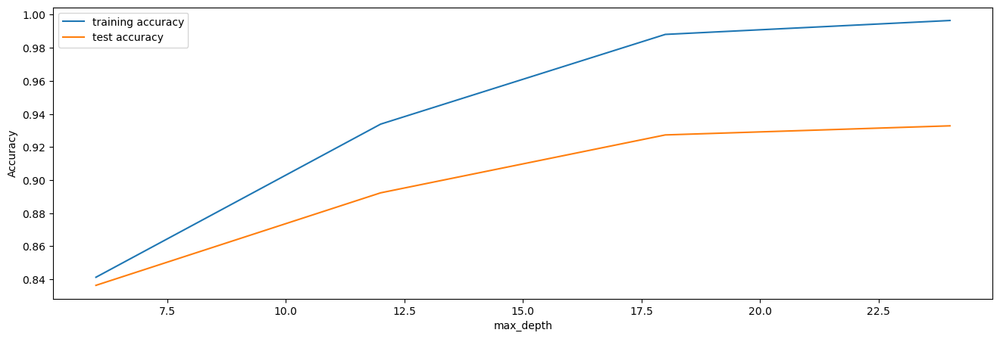

In [114]:
# parameters to build the model on
parameters = {'max_depth': range(6, 30, 6)}
tune_hyperparameter(parameters,X_train_pca, y_train)

In [115]:
# # parameters to build the model on
# parameters = {'n_estimators': range(100, 1000, 200)}
# tune_hyperparameter(parameters,X_train_pca,y_train)

Observation: By looking into this plot we can see that, both train and test accuracy increases till one point and then it's flatten down so the optimal value for max_depth that we can consider would be 18 as nearby to that the lines are flattening

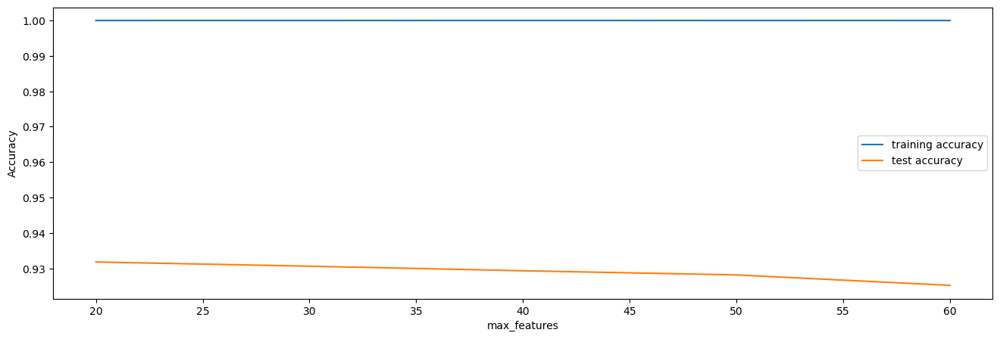

In [121]:
# parameters to build the model on
parameters = {'max_features': [20,30,40,50,60]}
tune_hyperparameter(parameters,X_train_pca,y_train,4)

Observation: Accuracy for the training seems to be stable and linear in nature while test accuracy shows as minor slope which starts from around 25 features so we will take 25 as an optimal value as after that accuracy seems to be going down

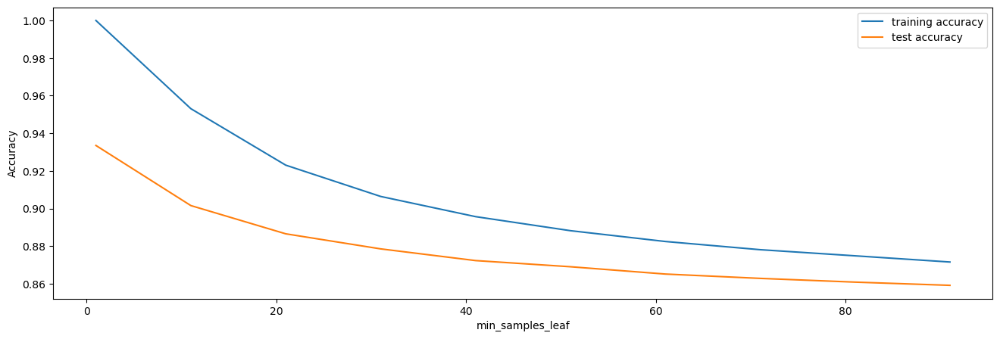

In [122]:
# parameters to build the model on
parameters = {'min_samples_leaf': range(1, 100, 10)}
tune_hyperparameter(parameters,X_train_pca,y_train)

Observation: In this case value 10 seems like a optimal number for min_samples_leaf as both train and test accuracy is decreasing and model starts to overfit.

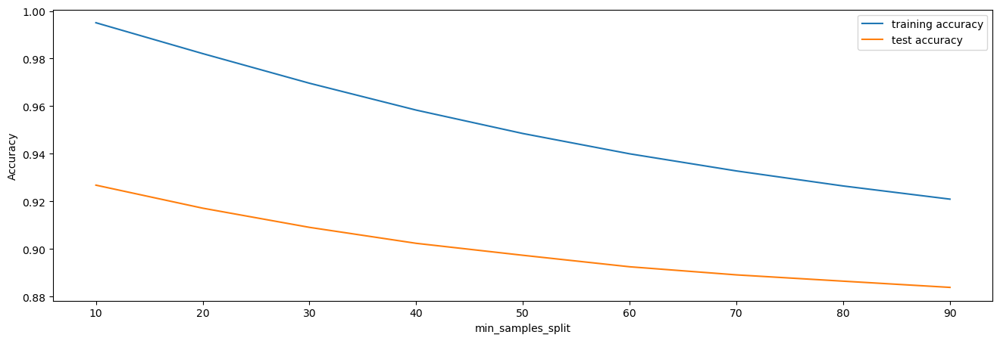

In [123]:
# parameters to build the model on
parameters = {'min_samples_split': range(10, 100, 10)}
tune_hyperparameter(parameters,X_train_pca,y_train)


Observation: So for min_samples_split too, 10 seems to be a optimal value as after that both train and test accuracy is decreasing quickly.

In [98]:
randomForest_with_gcv_1 = RandomForestClassifier(class_weight='balanced', random_state=42, 
                                               max_depth=18, n_estimators=200, 
                                               min_samples_leaf=10, min_samples_split=10, max_features=25, oob_score=True)

In [99]:
randomForest_with_gcv_1.fit(X_train_pca, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=18, max_features=25,
                       min_samples_leaf=10, min_samples_split=10,
                       n_estimators=200, oob_score=True, random_state=42)

In [100]:
Y_rf_pred_train_gcv_1 = randomForest_with_gcv_1.predict(X_train_pca)
Y_rf_pred_test_gcv_1 = randomForest_with_gcv_1.predict(X_test_pca)


# Model evaluation on training data
print('Model evaluation on Training data :')
acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion = evaluate_model_on_trainset(y_train, Y_rf_pred_train_gcv_1)

print('-'*50)

# Model evaluation on test data
print('Model evaluation on Testing data :')
acc_score, roc_score, prec_score, rec_score, sensitivity, specificity, confusion = evaluate_model_on_testset(y_test, Y_rf_pred_test_gcv_1)

Model evaluation on Training data :
Accuracy Score :  96.33
ROC AUC score :  96.33
Precision score :  95.77
Recall score :  96.94
Sensitivity :  96.94
Specificity :  95.72
Confusion Matrix : 
 [[48144  2152]
 [ 1541 48750]]
--------------------------------------------------
Model evaluation on Testing data :
Accuracy Score :  91.63
ROC AUC score :  91.63
Precision score :  91.65
Recall score :  91.6
Sensitivity :  91.6
Specificity :  91.66
Confusion Matrix : 
 [[11522  1049]
 [ 1056 11520]]


### Observations:
- After creating several models with and without Cross Validation, Random Forest with hyper parameters tuned gave the highest training accuracy of 96.33% and testing accuracy of 91.63%. 

In [101]:
final_model = randomForest_with_gcv_1
final_model

RandomForestClassifier(class_weight='balanced', max_depth=18, max_features=25,
                       min_samples_leaf=10, min_samples_split=10,
                       n_estimators=200, oob_score=True, random_state=42)

## Now as we have our final model we can proceed towards testing it on the actual test data set.

In [372]:
test_data = pd.read_csv('test.csv')

In [373]:
test_data.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,6/21/2014,7/26/2014,8/24/2014,30,30,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1692,0.00,0.00,0.00
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,6/19/2014,7/16/2014,8/24/2014,250,0,0,NaN,NaN,Na

In [374]:
test_data.shape

(30000, 171)

In [375]:
test_data.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
0,69999,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.0,0.0,0.0,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,6/21/2014,7/26/2014,8/24/2014,30,30,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1692,0.00,0.00,0.00
1,70000,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.0,0.0,0.0,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,6/19/2014,7/16/2014,8/24/2014,250,0,0,NaN,NaN,Na

In [376]:
print(test_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Columns: 171 entries, id to jun_vbc_3g
dtypes: float64(135), int64(27), object(9)
memory usage: 39.1+ MB
None


In [377]:
test_data.dtypes.value_counts()

float64    135
int64       27
object       9
dtype: int64

In [378]:
# checking the duplicates rows in the dataset
print('Number of duplicate rows in dataset:', test_data.duplicated().sum())

Number of duplicate rows in dataset: 0


In [379]:
test_data.describe()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g
count,30000.000000,30000.0,29684.0,29684.0,29684.0,30000.000000,30000.000000,30000.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.0,28828.0,28325.0,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,30000.000000,30000.000000,30000.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.0,28828.0,28325.0,28831.000000,28828.000000,28325.000000,30000.000000,30000.000000,30000.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,7585.000000,7706.000000,7922.000000,7585.000000,7706.000000,7922.000000,7585.000000,7706.000000,7922.000000,7585.000000,7706.000000,7922.000000,7585.000000,7706.000000,7922.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.

In [380]:
# Cheking percent of missing values in columns
columns_with_values_df = (round(((test_data.isnull().sum()/len(test_data.index))*100),2).to_frame('null')).sort_values('null', ascending=False)
columns_with_values_df

,null
arpu_3g_6,74.72
count_rech_3g_6,74.72
fb_user_6,74.72
night_pck_user_6,74.72
total_rech_data_6,74.72
max_rech_data_6,74.72
count_rech_2g_6,74.72
date_of_last_rech_data_6,74.72
av_rech_amt_data_6,74.72
arpu_2g_6,74.72


In [381]:
# List the columns having more than 30% missing values
columns_with_above_30_per_null_values = list(columns_with_values_df.index[columns_with_values_df['null'] > 30])

In [382]:
print('Number of Columns which have more than 30% of records null:', len(columns_with_above_30_per_null_values))

Number of Columns which have more than 30% of records null: 30


In [383]:
print(columns_with_above_30_per_null_values)

['arpu_3g_6', 'count_rech_3g_6', 'fb_user_6', 'night_pck_user_6', 'total_rech_data_6', 'max_rech_data_6', 'count_rech_2g_6', 'date_of_last_rech_data_6', 'av_rech_amt_data_6', 'arpu_2g_6', 'night_pck_user_7', 'arpu_2g_7', 'fb_user_7', 'arpu_3g_7', 'count_rech_2g_7', 'av_rech_amt_data_7', 'max_rech_data_7', 'count_rech_3g_7', 'total_rech_data_7', 'date_of_last_rech_data_7', 'night_pck_user_8', 'arpu_3g_8', 'arpu_2g_8', 'count_rech_3g_8', 'total_rech_data_8', 'av_rech_amt_data_8', 'max_rech_data_8', 'fb_user_8', 'count_rech_2g_8', 'date_of_last_rech_data_8']


In [384]:
# Dropping the columns having more than 30% null records
test_data.drop(columns_with_above_30_per_null_values, axis=1, inplace=True)

In [385]:
# Checking the data after removing certain null columns
test_data.shape

total_columns_with_some_missing_values = test_data.isnull().any().sum()
print(f'There are {total_columns_with_some_missing_values} features which have null value with percentage below 30')

# Observation: Now we only left with 95 columns which have less than 30% of null value records

There are 95 features which have null value with percentage below 30


In [386]:
columns_with_missing_values = test_data.columns[test_data.isnull().any()]

# Convert it to a list
columns_with_missing_values_list = columns_with_missing_values.tolist()

In [387]:
# Filtering categorical and numerical variables
categorical_columns = test_data[columns_with_missing_values_list].columns[test_data[columns_with_missing_values_list].dtypes == 'object']
numerical_columns = test_data[columns_with_missing_values_list].columns[test_data[columns_with_missing_values_list].dtypes != 'object']
print('Number of categorical columns with some missing values:', len(categorical_columns)) 
print('Number of numerical columns with some missing values:', len(numerical_columns))

Number of categorical columns with some missing values: 5
Number of numerical columns with some missing values: 90


In [388]:
# Describing the numerical type columns
test_data[numerical_columns].describe()

# Observation: We can see from the result that there are columns that have mean=0 and std=0, which indicates that these columns shows no variation and have constant values for all records.
# Moving forward we will remove these types of columns

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8
count,29684.0,29684.0,29684.0,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.0,28828.0,28325.0,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.0,28828.0,28325.0,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000,28831.000000,28828.000000,28325.000000
mean,0.0,0.0,0.0,130.629693,133.148632,133.111348,195.745473,196.792375,196.647889,10.380431,7.465889,7.967267,13.269785,9.763957,10.440251,47.557601,47.188688,46.359887,93.584273,92.793180,93.238288,3.769281,3.830238,3.716231,1.116132,1.385891,1.464202,144.918443,143.819463,143.321709,77.988809,82.187570,82.840749,85.311712,89.089166,88.086236,1.135152,1.187272,1.091321,0.0,0.0,0.0,164.438342,172.466703,172.020983,0.687545,0.695952,0.673280,3.819317,4.981770,5.074228,0.434514,0.043803,0.034106,47.640461,48.242191,47.105979,108.229345,108.593000,109.176219,12.162732,12.683831,11.833917,168.041232,169.527815,168.124943,9.806934,10.335148,9.822375,20.692815,21.588831,21.403619,2.180007,2.257851,2.107999,0.0,0.0,0.0,32.682316,34.184426,33.336607,0.060682,0.034085,0.040291,7.615543,8.717343,8.661023,0.856037,0.997268,0.988557
std,0.0,0.0,0.0,290.677420,302.921820,301.951806,316.923836,333.628481,334.277643,99.973352,103.337675,94.622596,66.475975,58.325466,64.933372,150.588656,156.664295,145.087354,164.481651,165.674188,164.516683,16.156500,15.772920,13.864608,4.695667,6.559241,7.316747,251.092969,254.278712,247.240694,246.248819,256.339646,261.860321,255.252441,273.537846,275.751699,7.619692,9.207658,8.375128,0.0,0.0,0.0,384.991155,408.036124,413.814560,12.179579,13.874719,11.582123,12.536781,16.427132,18.193925,1.922616,2.950457,2.523530,139.696271,141.099955,127.364151,179.081640,178.346438,177.647914,41.782876,41.744180,40.313428,257.700805,259.830482,251.745391,60.090285,60.282046,56.95837

In [389]:
# Describing the categorical type columns
test_data[categorical_columns].describe()

,last_date_of_month_7,last_date_of_month_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8
count,29798,29633,29494,29467,28839
unique,1,1,30,31,31
top,7/31/2014,8/31/2014,6/30/2014,7/31/2014,8/31/2014
freq,29798,29633,5080,5082,4382


In [390]:
no_variation_columns = [i for i in numerical_columns if test_data[i].nunique() == 1]
no_variation_columns

['loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'std_og_t2c_mou_6',
 'std_og_t2c_mou_7',
 'std_og_t2c_mou_8',
 'std_ic_t2o_mou_6',
 'std_ic_t2o_mou_7',
 'std_ic_t2o_mou_8']

##### dropping columns with no variation

In [391]:
test_data.drop(no_variation_columns, axis=1, inplace=True)

In [392]:
test_data.drop(['circle_id'], axis=1, inplace=True)

In [393]:
test_data.shape

(30000, 131)

### Null Value Imputation

##### For Numerical Features:

In [394]:
numerical_columns = list(set(numerical_columns).difference(set(no_variation_columns)))
len(numerical_columns)

81

In [395]:
test_data[numerical_columns].describe(percentiles=[0.05, 0.10, 0.25, 0.50, 0.75, 0.85, 0.90, 0.95, 0.97, 0.99])

,offnet_mou_7,std_ic_t2f_mou_8,loc_og_t2f_mou_7,roam_ic_mou_8,std_ic_t2t_mou_8,loc_ic_mou_7,isd_ic_mou_8,loc_ic_t2m_mou_7,std_ic_t2f_mou_7,offnet_mou_8,spl_og_mou_6,loc_og_t2m_mou_6,loc_og_t2m_mou_7,std_ic_t2f_mou_6,offnet_mou_6,loc_og_t2m_mou_8,loc_ic_t2m_mou_6,roam_ic_mou_6,std_og_t2m_mou_8,loc_og_t2c_mou_6,loc_og_t2t_mou_8,std_og_mou_6,isd_ic_mou_6,loc_og_mou_7,loc_og_mou_8,std_ic_t2m_mou_8,loc_og_t2t_mou_7,spl_ic_mou_7,loc_ic_mou_6,ic_others_8,std_og_t2m_mou_6,isd_og_mou_7,std_og_t2t_mou_7,loc_og_t2c_mou_8,std_ic_t2t_mou_7,roam_og_mou_8,loc_ic_mou_8,loc_ic_t2t_mou_7,std_og_t2f_mou_7,loc_ic_t2t_mou_8,og_others_6,loc_ic_t2f_mou_7,std_og_t2m_mou_7,onnet_mou_7,loc_og_t2f_mou_8,loc_ic_t2t_mou_6,loc_ic_t2m_mou_8,loc_og_t2c_mou_7,spl_ic_mou_6,std_og_t2t_mou_8,loc_og_t2t_mou_6,std_ic_t2m_mou_7,loc_og_mou_6,spl_ic_mou_8,onnet_mou_6,roam_og_mou_7,isd_og_mou_6,std_ic_mou_7,onnet_mou_8,isd_og_mou_8,ic_others_7,isd_ic_mou_7,loc_og_t2f_mou_6,og_others_8,std_og_t2t_mou_6,roam_og_mou_6,roam_ic_mou_7,ic_others_6,std_og_mou_8,std_ic_mou_6,loc_ic_t2f_mou_6,std_og_mou_7,std_ic_mou_8,std_ic_t2t_mou_6,spl_og_mou_8,og_others_7,spl_og_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_6,loc_ic_t2f_mou_8,std_ic_t2m_mou_6
count,28828.000000,28325.000000,28828.000000,28325.000000,28325.000000,28828.000000,28325.000000,28828.000000,28828.000000,28325.000000,28831.000000,28831.000000,28828.000000,28831.000000,28831.000000,28325.000000,28831.000000,28831.000000,28325.000000,28831.000000,28325.000000,28831.000000,28831.000000,28828.000000,28325.000000,28325.000000,28828.000000,28828.000000,28831.000000,28325.000000,28831.000000,28828.000000,28828.000000,28325.000000,28828.000000,28325.000000,28325.000000,28828.000000,28828.000000,28325.000000,28831.000000,28828.000000,28828.000000,28828.000000,28325.000000,28831.000000,28325.000000,28828.000000,28831.000000,28325.000000,28831.000000,28828.000000,28831.000000,28325.000000,28831.000000,28828.000000,28831.000000,28828.000000,28325.000000,28325.000000,28828.000000,28828.000000,28831.000000,28325.000000,28831.000000,28831.000000,28828.000000,28831.000000,28325.000000,28831.000000,28831.000000,28828.000000,28325.000000,28831.000000,28325.000000,28828.000000,28828.000000,28325.000000,28831.000000,28325.000000,28831.000000
mean,196.792375,2.107999,3.830238,7.967267,9.822375,169.527815,8.661023,108.593000,2.257851,196.647889,3.819317,93.584273,92.793180,2.180007,195.745473,93.238288,108.229345,10.380431,88.086236,1.116132,46.359887,164.438342,7.615543,143.819463,143.321709,21.403619,47.188688,0.034085,168.041232,0.988557,85.311712,0.695952,82.187570,1.464202,10.335148,10.440251,168.124943,48.242191,1.187272,47.105979,0.434514,12.683831,89.089166,133.148632,3.716231,47.640461,109.176219,1.385891,0.060682,82.840749,47.557601,21.588831,144.918443,0.040291,130.629693,9.763957,0.687545,34.184426,133.111348,0.673280,0.997268,8.717343,3.769281,0.034106,77.988809,13.269785,7.465889,0.856037,172.020983,32.682316,12.162732,172.466703,33.336607,9.806934,5.074228,0.043803,4.981770,1.091321,1.135152,11.833917,20.692815
std,333.628481,15.688503,15.772920,94.622596,56.958371,259.830482,65.457864,178.346438,17.095798,334.277643,12.536781,164.481651,165.674188,16.433571,316.923836,164.516683,179.081640,99.973352,275.751699,4.695667,145.087354,384.991155,56.756434,254.278712,247.240694,88.511232,156.664295,0.191947,257.700805,16.409030,255.252441,13.874719,256.339646,7.316747,60.282046,64.933372,251.745391,141.099955,9.207658,127.364151,1.922616,41.744180,273.537846,302.921820,13.864608,139.696271,177.647914,6.559241,0.151429,261.860321,150.588656,84.642031,251.092969,0.140695,290.677420,58.325466,12.179579,112.729933,301.951806,11.582123,11.278967,68.844483,16.156500,2.523530,246.248819,66.475975,103.337675,11.490315,413.814560,110.593850,41.782876,408.036124,113.913175,60.090285,18.193925,2.950457,16.427132,8.375128,7.619692,40.313428,81.947033
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0

In [396]:
# Here We are imputing the mean value of the columns to treat null values.
for feature in numerical_columns:
    col_mean = test_data[feature].mean()
    test_data[feature].fillna(col_mean, inplace=True)

In [397]:
test_data[numerical_columns].isnull().any().sum()

# Observation: All the null values are imputed for numerical columns

0

##### For Categorical Features:

In [399]:
# Here we imputing '8/31/2014' as value to remove null values.
test_data['last_date_of_month_7'].fillna('7/31/2014', inplace=True)

In [400]:
# Here we imputing '9/31/2014' as value to remove null values.
test_data['last_date_of_month_8'].fillna('8/31/2014', inplace=True)

In [401]:
test_data['date_of_last_rech_6'] = pd.to_datetime(test_data['date_of_last_rech_6'])
test_data['date_of_last_rech_7'] = pd.to_datetime(test_data['date_of_last_rech_7'])
test_data['date_of_last_rech_8'] = pd.to_datetime(test_data['date_of_last_rech_8'])

Deriving new columns -> time_since_recharge_6 and time_since_recharge_7

In [402]:
test_data['time_since_recharge_6'] = (test_data['date_of_last_rech_8'] - test_data['date_of_last_rech_6']).dt.days
test_data['time_since_recharge_7'] = (test_data['date_of_last_rech_8'] - test_data['date_of_last_rech_7']).dt.days

test_data['time_since_recharge_6'].fillna(0, inplace = True)
test_data['time_since_recharge_7'].fillna(0, inplace = True)

In [403]:
# Now we can drop the last_rech columns.
drop_columns = ['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8']
test_data.drop(drop_columns, axis = 1, inplace=True)

In [404]:
test_data.isnull().any().sum()

# Observation: Now there are no null values in the dataset

0

In [405]:
# Dropping last date of month columns as they will not contribute in the final model
test_data.drop(columns=['last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8'], axis=1, inplace=True)

In [406]:
test_data.shape

(30000, 127)

# Feature Engineering

Previously we have already derived 2 new features named time_since_recharge_6 an time_since_recharge_8

#### Deriving New Features

In [407]:
# Total mou at good phase incoming and outgoing
test_data['total_mou_good'] = (test_data['total_og_mou_6'] + test_data['total_ic_mou_6'])

In [408]:
# Avg. mou at action phase. We are taking average because there are two months(7 and 8) in action phase
test_data['avg_mou_action'] = (test_data['total_og_mou_7'] + test_data['total_og_mou_8'] + test_data['total_ic_mou_7'] + test_data['total_ic_mou_8'])/2

In [409]:
# Difference avg_mou_good and avg_mou_action
test_data['diff_mou'] = test_data['avg_mou_action'] - test_data['total_mou_good']

In [410]:
# Storing whether the mou has decreased in action phase
test_data['decrease_mou_action'] = np.where((test_data['diff_mou'] < 0), 1, 0)
test_data.head()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,time_since_recharge_6,time_since_recharge_7,total_mou_good,avg_mou_action,diff_mou,decrease_mou_action
0,69999,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,30,30,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1692,0.00,0.00,0.00,64.0,29.0,133.67,95.075,-38.595,1
1,70000,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,250,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,2533,0.00,0.00,0.00,66.0,39.0,846.19,849.975,3.785,0
2,70001,329.844,434.884,746.239,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,6,9,5,500,1000,1000,300,500,500,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,277,525.61,758.41,241.84,60.0,32.0,0.00,0.000,0.000,0
3,70002,43.550,171.390,24.400,5.31,2.16,0.00,40.04,205.01,24.01,0.00,0.00,0.00,0.00,0.00,0.00,5.31,0.00,0.00,2.94,98.61,20.51,0.00,0.00,2.35,0.0,6.18,0.00,8.26,98.61,22.86,0.00,2.16,0.00,37.09,94.36,0.00,0.0,0.0,0.0,37.09,96.53,0.00,0.0,0.0

In [411]:
# Avg rech number at action phase
test_data['avg_rech_num_action'] = (test_data['total_rech_num_7'] + test_data['total_rech_num_8'])/2

In [412]:
# Difference total_rech_num_6 and avg_rech_action
test_data['diff_rech_num'] = test_data['avg_rech_num_action'] - test_data['total_rech_num_6']

In [413]:
# Storing if rech_num has decreased in action phase
test_data['decrease_rech_num_action'] = np.where((test_data['diff_rech_num'] < 0), 1, 0)
test_data.head()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,time_since_recharge_6,time_since_recharge_7,total_mou_good,avg_mou_action,diff_mou,decrease_mou_action,avg_rech_num_action,diff_rech_num,decrease_rech_num_action
0,69999,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,30,30,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1692,0.00,0.00,0.00,64.0,29.0,133.67,95.075,-38.595,1,4.5,-0.5,1
1,70000,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,250,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,2533,0.00,0.00,0.00,66.0,39.0,846.19,849.975,3.785,0,4.5,-0.5,1
2,70001,329.844,434.884,746.239,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,6,9,5,500,1000,1000,300,500,500,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,277,525.61,758.41,241.84,60.0,32.0,0.00,0.000,0.000,0,7.0,1.0,0
3,70002,43.550,171.390,24.400,5.31,2.16,0.00,40.04,205.01,24.01,0.00,0.00,0.00,0.00,0.00,0.00,5.31,0.00,0.00,2.94,98.61,20.51,0.00,0.00,2.35,0.0,6.18

In [414]:
# Avg rech_amt in action phase
test_data['avg_rech_amt_action'] = (test_data['total_rech_amt_7'] + test_data['total_rech_amt_8'])/2

In [415]:
# Difference of action phase rech amt and good phase rech amt
test_data['diff_rech_amt'] = test_data['avg_rech_amt_action'] - test_data['total_rech_amt_6']

In [416]:
# Storing if rech_amt has decreased in action phase
test_data['decrease_rech_amt_action'] = np.where((test_data['diff_rech_amt'] < 0), 1, 0) 
test_data.head()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,time_since_recharge_6,time_since_recharge_7,total_mou_good,avg_mou_action,diff_mou,decrease_mou_action,avg_rech_num_action,diff_rech_num,decrease_rech_num_action,avg_rech_amt_action,diff_rech_amt,decrease_rech_amt_action
0,69999,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,30,30,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1692,0.00,0.00,0.00,64.0,29.0,133.67,95.075,-38.595,1,4.5,-0.5,1,75.0,-28.0,1
1,70000,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,250,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,2533,0.00,0.00,0.00,66.0,39.0,846.19,849.975,3.785,0,4.5,-0.5,1,500.0,0.0,0
2,70001,329.844,434.884,746.239,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,6,9,5,500,1000,1000,300,500,500,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,277,525.61,758.41,241.84,60.0,32.0,0.00,0.000,0.000,0,7.0,1.0,0,1000.0,500.0,0
3,70002,43.550,171.390,24.400,5.31,2.16,0.00,40.04

In [417]:
# ARUP in action phase
test_data['avg_arpu_action'] = (test_data['arpu_7'] + test_data['arpu_8'])/2

In [418]:
# Difference of good and action phase ARPU
test_data['diff_arpu'] = test_data['avg_arpu_action'] - test_data['arpu_6']

In [419]:
# Storing whether the arpu has decreased on the action month
test_data['decrease_arpu_action'] = np.where(test_data['diff_arpu'] < 0, 1, 0)
test_data.head()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,time_since_recharge_6,time_since_recharge_7,total_mou_good,avg_mou_action,diff_mou,decrease_mou_action,avg_rech_num_action,diff_rech_num,decrease_rech_num_action,avg_rech_amt_action,diff_rech_amt,decrease_rech_amt_action,avg_arpu_action,diff_arpu,decrease_arpu_action
0,69999,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,30,30,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1692,0.00,0.00,0.00,64.0,29.0,133.67,95.075,-38.595,1,4.5,-0.5,1,75.0,-28.0,1,64.8875,-26.9945,1
1,70000,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,250,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,2533,0.00,0.00,0.00,66.0,39.0,846.19,849.975,3.785,0,4.5,-0.5,1,500.0,0.0,0,438.2180,24.0500,0
2,70001,329.844,434.884,746.239,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,6,9,5,500,1000,1000,300,500,500,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,277,525.61,758.41,241.84,60.0,32.0,0.00,0.00

In [420]:
# VBC in action phase
test_data['avg_vbc_3g_action'] = (test_data['jul_vbc_3g'] + test_data['aug_vbc_3g'])/2

In [421]:
# Difference of good and action phase VBC
test_data['diff_vbc'] = test_data['avg_vbc_3g_action'] - test_data['jun_vbc_3g']

In [422]:
# Checking whether the VBC has decreased on the action month
test_data['decrease_vbc_action'] = np.where(test_data['diff_vbc'] < 0 , 1, 0)
test_data.head()

,id,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,time_since_recharge_6,time_since_recharge_7,total_mou_good,avg_mou_action,diff_mou,decrease_mou_action,avg_rech_num_action,diff_rech_num,decrease_rech_num_action,avg_rech_amt_action,diff_rech_amt,decrease_rech_amt_action,avg_arpu_action,diff_arpu,decrease_arpu_action,avg_vbc_3g_action,diff_vbc,decrease_vbc_action
0,69999,91.882,65.330,64.445,31.78,20.23,23.11,60.16,32.16,34.83,0.00,0.00,0.00,0.00,0.00,0.00,24.88,20.23,21.06,18.13,10.89,8.36,0.00,13.58,0.00,0.0,0.00,0.03,43.01,44.71,29.43,6.90,0.00,2.05,42.03,7.68,26.43,0.0,0.0,0.0,48.93,7.68,28.48,0.0,0.0,0.0,0.00,0.00,0.03,0.0,0.0,0.0,91.94,52.39,57.94,30.33,37.56,21.98,10.21,4.59,9.53,0.26,0.00,0.00,40.81,42.16,31.51,0.00,0.00,0.00,0.36,1.04,4.34,0.0,0.0,0.00,0.36,1.04,4.34,41.73,43.56,36.26,0.54,0.34,0.39,0.00,0.00,0.00,0.0,0.0,0.00,5,5,4,103,90,60,50,30,30,30,30,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1692,0.00,0.00,0.00,64.0,29.0,133.67,95.075,-38.595,1,4.5,-0.5,1,75.0,-28.0,1,64.8875,-26.9945,1,0.00,0.00,0
1,70000,414.168,515.568,360.868,75.51,41.21,19.84,474.34,621.84,394.94,0.00,0.00,0.00,0.00,0.00,0.00,75.51,41.21,19.84,473.61,598.08,377.26,0.73,0.00,0.00,0.0,0.00,0.00,549.86,639.29,397.11,0.00,0.00,0.00,0.00,23.76,17.68,0.0,0.0,0.0,0.00,23.76,17.68,0.0,0.0,0.8,0.00,0.00,0.00,0.0,0.0,0.0,549.86,663.06,415.59,19.99,26.95,2.61,160.19,122.29,184.81,1.49,0.00,0.00,181.69,149.24,187.43,0.00,0.00,0.00,0.00,12.51,0.00,0.0,0.0,0.00,0.00,12.51,0.00,296.33,339.64,281.66,0.00,0.00,0.00,114.63,177.88,94.23,0.0,0.0,0.00,5,4,5,500,500,500,250,250,250,250,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,2533,0.00,0.00,0.00,66.0,39.0,846.19,849.975,3.785,0,4.5,-0.5,1,500.0,0.0,0,438.2180,24.0500,0,0.00,0.00,0
2,70001,329.844,434.884,746.239,7.54,7.86,8.40,16.98,45.81,45.04,22.81,103.38,26.08,24.53,53.68,54.44,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,6,9,5,500,1000,1000,300,500,500,0,0,0,0.0,0.0,0.0,0.0,0.0,0

In [423]:
test_data.shape

(30000, 143)

In [425]:
test_data.dtypes.value_counts()

float64    112
int64       31
dtype: int64

In [426]:
numerical_columns_test = test_data.columns[(test_data.dtypes != 'object') | (test_data.dtypes != 'datetime64[ns]')].to_list()
print(numerical_columns_test)

['id', 'arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8

In [427]:
len(numerical_columns_test)

143

In [428]:
numerical_columns_test.remove('id')

In [429]:
test_data[numerical_columns_test] = scaler.transform(test_data[numerical_columns_test])

In [430]:
test_data.shape

(30000, 143)

In [432]:
test_data_pca = pca_final.transform(test_data[numerical_columns_test])

In [433]:
test_data_pca.shape

(30000, 60)

## Performing prediction on test data

In [434]:
final_test_prediction = final_model.predict(test_data_pca)


In [435]:
test_data['churn_probability'] = final_test_prediction

In [438]:
submission_data = test_data[['id', 'churn_probability']]

In [439]:
submission_data.to_csv('Submission.csv', index=False)